In [ ]:
!pip install colorama

In [ ]:
#Ground water level prediction based on pre and post monsoon data
from google.colab import files
import os
import openpyxl
import numpy as np
import pandas as pd
from keras.models import Sequential
from keras.layers import Dense, LSTM
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_context("paper", font_scale=1.3)
sns.set_style('white')

from tabulate import tabulate
from colorama import Fore, Style

In [ ]:
dataFile = '/content/water level data.xlsx'
# check if the file exists
if not os.path.isfile(dataFile):
  # if the file does not exist, upload it
  uploaded = files.upload()
else:
  # if the file exists, do not upload it
  uploaded = {}

# read the data for each sheet into a dictionary of data frames
sheet_names = ['pre monsoon', 'post monsoon']
dfs = {}
for sheet_name in sheet_names:
  df = pd.read_excel(dataFile, sheet_name=sheet_name, engine='openpyxl', header=None, skiprows=1)
  start_row = df.index[0] + 1
  end_row = df.index[-1] + 1
  sheet_df = pd.read_excel(dataFile, sheet_name=sheet_name, engine='openpyxl', header=1, skiprows=range(1, start_row), nrows=end_row - start_row)
  dfs[sheet_name] = {'data': sheet_df, 'locations': sheet_df['Location'].unique()}

In [ ]:
def create_lstm_model(X, y):
  # define the LSTM model architecture for X
  model = Sequential()
  model.add(LSTM(50, activation="relu", input_shape=(X.shape[1], X.shape[2])))
  model.add(Dense(y.shape[1]))
  model.compile(loss='mse', optimizer='adam', metrics=['accuracy'])
  #print the model metrics "accuracy" if it exists
  #if hasattr(model, "accuracy"):

    #print( f"Model accuracy: {model.accuracy}")

  return model



In [ ]:
def prepare_data(location, df_dict, min_samples=10):
  # get pre-monsoon and post-monsoon data for the given location
  dfs = df_dict.values()
  df1 = None
  df2 = None
  locations = []
  for df in dfs:
      locations += list(df['data']['Location'].unique())
      #print(locations)
  locations = list(set(locations))
  #print(locations)
  for df in dfs:
      if location in df['data']['Location'].unique():
          # print(location)
          if df1 is None:
              df1 = df['data'][df['data']['Location'] == location]
            #  print(df1)
          else:
              df2 = df['data'][df['data']['Location'] == location]
  # check if there are enough samples for the location
  if df1 is None or df2 is None or df1.shape[0] < min_samples or df2.shape[0] < min_samples:
      print(f"Not enough samples for {location}, skipping...")
      return None
  # split the data into features (X) and target (y)
  X1 = df1.drop(['District', 'Location', 'Well Type'], axis=1).values
  #print(X1)
  y1 = df1.iloc[:, 2:-1].values
  #print(y1)
  X2 = df2.drop(['District', 'Location', 'Well Type'], axis=1).values
  y2 = df2.iloc[:, 2:-1].values
  # reshape the data for LSTM input
  X1 = X1.reshape((X1.shape[0], 1, X1.shape[1]))
  X2 = X2.reshape((X2.shape[0], 1, X2.shape[1]))
  return X1, y1, X2, y2

In [ ]:
def plot_graphs(y, y_pred, season, location):
  plt.figure(figsize=(18, 6))
  plt.plot(y, label = "Actual", marker="o")
  plt.plot(y_pred, label = "Predicted", marker = "*")
  plt.xlabel("sequence length")
  plt.ylabel("Actual and Predicted values")
  plt.title('Actual and predicted plot of {} at {}'.format(season, location))
  plt.legend()
  plt.savefig('{}_{}.png'.format(location, season))
  plt.show()

Epoch 1/100
1/1 - 4s - loss: 35.9495 - accuracy: 0.0000e+00 - 4s/epoch - 4s/step
Epoch 2/100
1/1 - 0s - loss: 35.2191 - accuracy: 0.0000e+00 - 8ms/epoch - 8ms/step
Epoch 3/100
1/1 - 0s - loss: 34.4804 - accuracy: 0.0000e+00 - 8ms/epoch - 8ms/step
Epoch 4/100
1/1 - 0s - loss: 33.7299 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 5/100
1/1 - 0s - loss: 32.9640 - accuracy: 0.0000e+00 - 14ms/epoch - 14ms/step
Epoch 6/100
1/1 - 0s - loss: 32.1788 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 7/100
1/1 - 0s - loss: 31.3706 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 8/100
1/1 - 0s - loss: 30.5356 - accuracy: 0.0000e+00 - 8ms/epoch - 8ms/step
Epoch 9/100
1/1 - 0s - loss: 29.6707 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 10/100
1/1 - 0s - loss: 28.7727 - accuracy: 0.0000e+00 - 8ms/epoch - 8ms/step
Epoch 11/100
1/1 - 0s - loss: 27.8394 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 12/100
1/1 - 0s - loss: 26.8691 - accuracy: 0.0000e+00 - 10ms/epoch - 10m

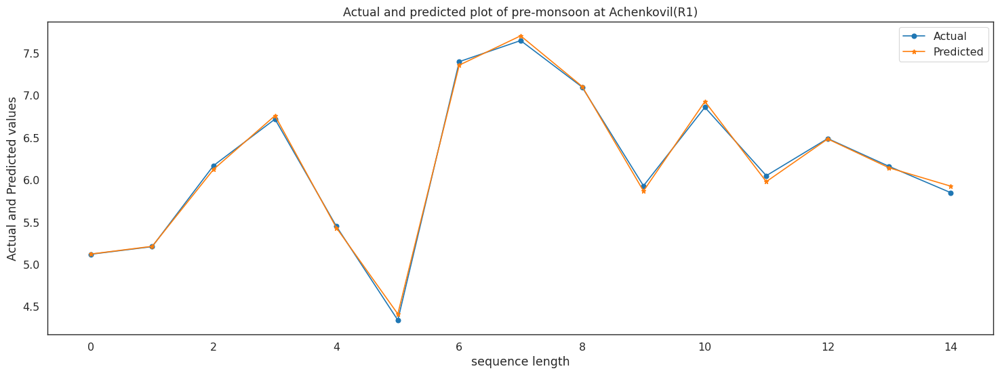

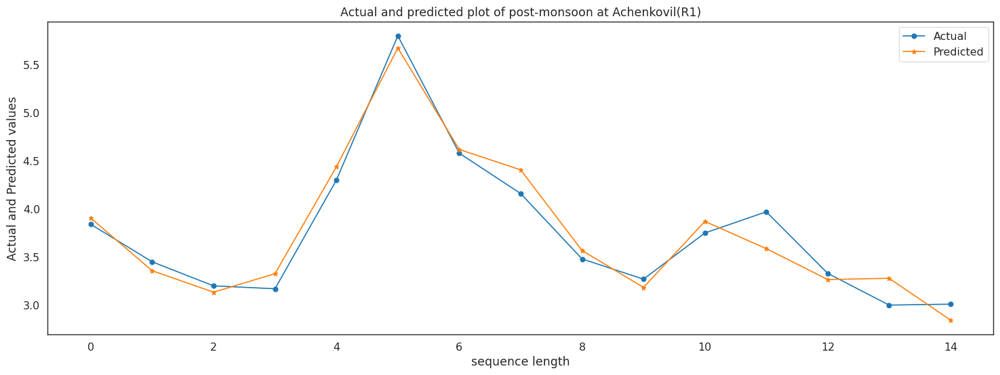

Epoch 1/100
1/1 - 2s - loss: 6.9225 - accuracy: 0.0000e+00 - 2s/epoch - 2s/step
Epoch 2/100
1/1 - 0s - loss: 6.8027 - accuracy: 0.0000e+00 - 16ms/epoch - 16ms/step
Epoch 3/100
1/1 - 0s - loss: 6.6865 - accuracy: 0.0000e+00 - 8ms/epoch - 8ms/step
Epoch 4/100
1/1 - 0s - loss: 6.5725 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 5/100
1/1 - 0s - loss: 6.4603 - accuracy: 0.0000e+00 - 8ms/epoch - 8ms/step
Epoch 6/100
1/1 - 0s - loss: 6.3535 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 7/100
1/1 - 0s - loss: 6.2483 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 8/100
1/1 - 0s - loss: 6.1443 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 9/100
1/1 - 0s - loss: 6.0401 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 10/100
1/1 - 0s - loss: 5.9351 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 11/100
1/1 - 0s - loss: 5.8293 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 12/100
1/1 - 0s - loss: 5.7226 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epo

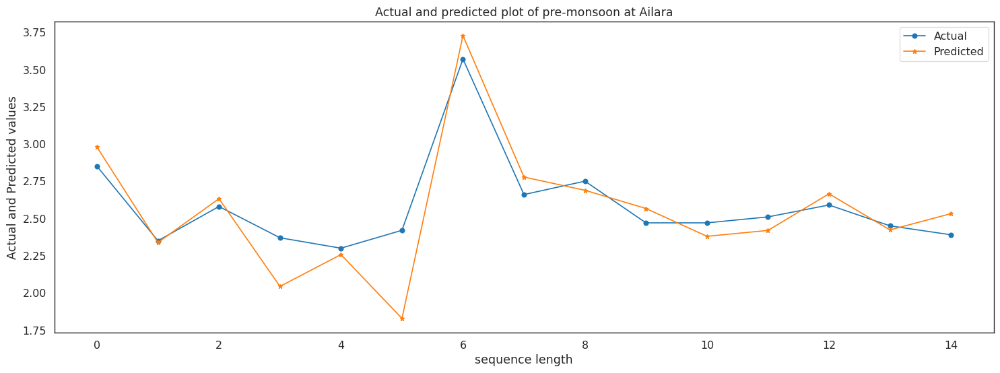

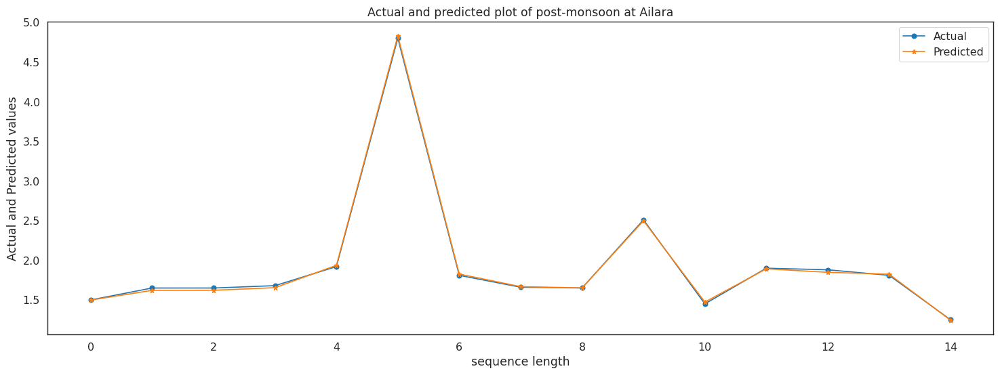

Epoch 1/100
1/1 - 2s - loss: 110.3365 - accuracy: 0.0000e+00 - 2s/epoch - 2s/step
Epoch 2/100
1/1 - 0s - loss: 108.3288 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 3/100
1/1 - 0s - loss: 106.4379 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 4/100
1/1 - 0s - loss: 104.6490 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 5/100
1/1 - 0s - loss: 102.9460 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 6/100
1/1 - 0s - loss: 101.3111 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 7/100
1/1 - 0s - loss: 99.7262 - accuracy: 0.0000e+00 - 15ms/epoch - 15ms/step
Epoch 8/100
1/1 - 0s - loss: 98.1722 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 9/100
1/1 - 0s - loss: 96.6402 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 10/100
1/1 - 0s - loss: 95.1234 - accuracy: 0.0000e+00 - 14ms/epoch - 14ms/step
Epoch 11/100
1/1 - 0s - loss: 93.5828 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 12/100
1/1 - 0s - loss: 92.0051 - accuracy: 0.0000e+00 - 

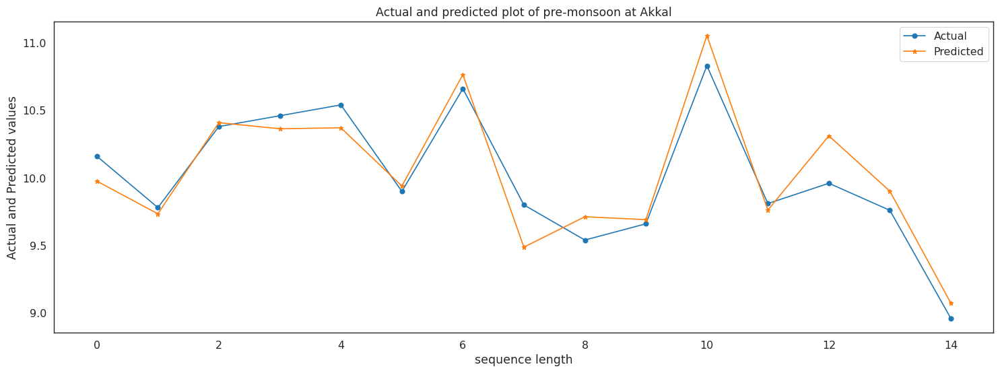

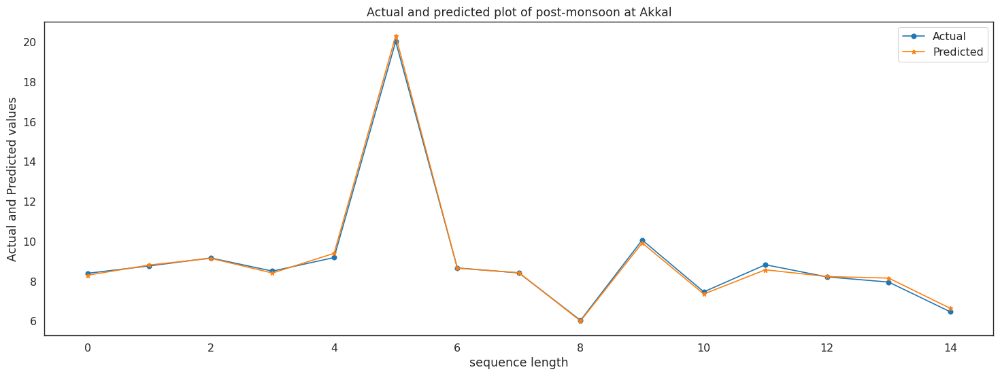

Epoch 1/100
1/1 - 3s - loss: 75.2769 - accuracy: 0.0000e+00 - 3s/epoch - 3s/step
Epoch 2/100
1/1 - 0s - loss: 74.0706 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 3/100
1/1 - 0s - loss: 72.8856 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 4/100
1/1 - 0s - loss: 71.7135 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 5/100
1/1 - 0s - loss: 70.5359 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 6/100
1/1 - 0s - loss: 69.3420 - accuracy: 0.0000e+00 - 14ms/epoch - 14ms/step
Epoch 7/100
1/1 - 0s - loss: 68.1208 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 8/100
1/1 - 0s - loss: 66.8727 - accuracy: 0.0000e+00 - 8ms/epoch - 8ms/step
Epoch 9/100
1/1 - 0s - loss: 65.5879 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 10/100
1/1 - 0s - loss: 64.2403 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 11/100
1/1 - 0s - loss: 62.8224 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 12/100
1/1 - 0s - loss: 61.3316 - accuracy: 0.0000e+00 - 9ms/epoch 

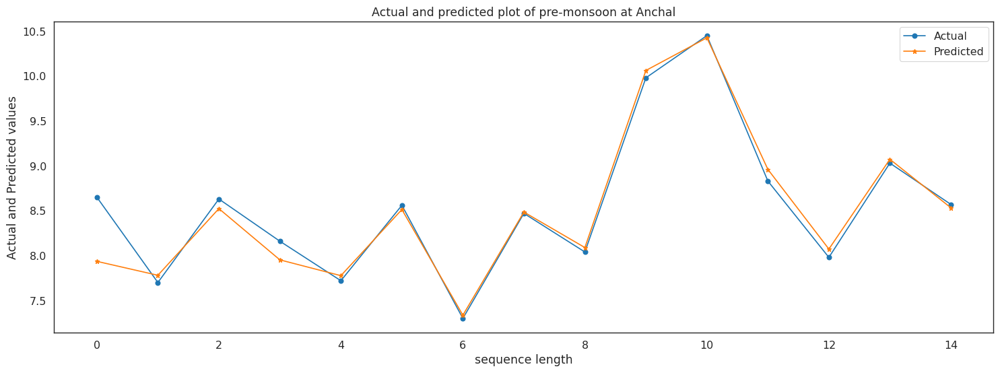

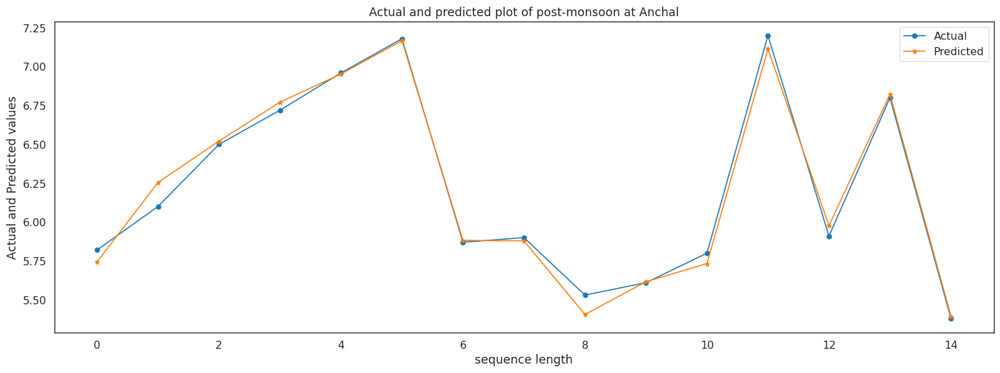

Epoch 1/100
1/1 - 2s - loss: 39.8443 - accuracy: 1.0000 - 2s/epoch - 2s/step
Epoch 2/100
1/1 - 0s - loss: 39.3147 - accuracy: 1.0000 - 12ms/epoch - 12ms/step
Epoch 3/100
1/1 - 0s - loss: 38.7965 - accuracy: 1.0000 - 15ms/epoch - 15ms/step
Epoch 4/100
1/1 - 0s - loss: 38.2834 - accuracy: 1.0000 - 9ms/epoch - 9ms/step
Epoch 5/100
1/1 - 0s - loss: 37.7709 - accuracy: 1.0000 - 9ms/epoch - 9ms/step
Epoch 6/100
1/1 - 0s - loss: 37.2541 - accuracy: 1.0000 - 14ms/epoch - 14ms/step
Epoch 7/100
1/1 - 0s - loss: 36.7294 - accuracy: 1.0000 - 9ms/epoch - 9ms/step
Epoch 8/100
1/1 - 0s - loss: 36.1927 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 9/100
1/1 - 0s - loss: 35.6402 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 10/100
1/1 - 0s - loss: 35.0691 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 11/100
1/1 - 0s - loss: 34.4840 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 12/100
1/1 - 0s - loss: 33.8793 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 13/100
1/1 - 0s

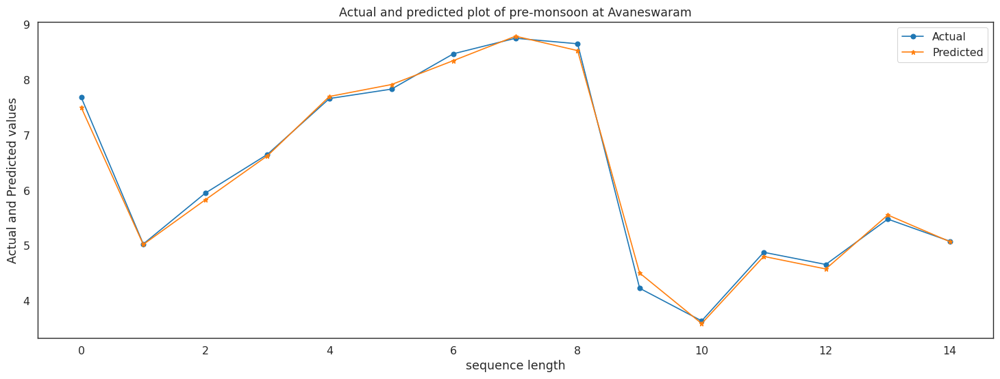

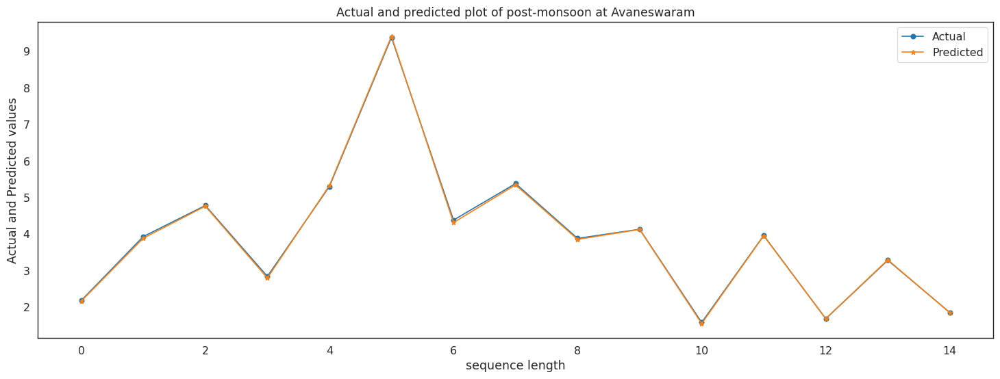

Epoch 1/100
1/1 - 2s - loss: 78.3140 - accuracy: 1.0000 - 2s/epoch - 2s/step
Epoch 2/100
1/1 - 0s - loss: 76.8791 - accuracy: 1.0000 - 12ms/epoch - 12ms/step
Epoch 3/100
1/1 - 0s - loss: 75.5480 - accuracy: 1.0000 - 12ms/epoch - 12ms/step
Epoch 4/100
1/1 - 0s - loss: 74.3189 - accuracy: 1.0000 - 13ms/epoch - 13ms/step
Epoch 5/100
1/1 - 0s - loss: 73.1869 - accuracy: 1.0000 - 13ms/epoch - 13ms/step
Epoch 6/100
1/1 - 0s - loss: 72.1372 - accuracy: 1.0000 - 8ms/epoch - 8ms/step
Epoch 7/100
1/1 - 0s - loss: 71.1622 - accuracy: 1.0000 - 9ms/epoch - 9ms/step
Epoch 8/100
1/1 - 0s - loss: 70.2543 - accuracy: 1.0000 - 9ms/epoch - 9ms/step
Epoch 9/100
1/1 - 0s - loss: 69.4236 - accuracy: 1.0000 - 10ms/epoch - 10ms/step
Epoch 10/100
1/1 - 0s - loss: 68.6525 - accuracy: 1.0000 - 10ms/epoch - 10ms/step
Epoch 11/100
1/1 - 0s - loss: 67.9140 - accuracy: 1.0000 - 12ms/epoch - 12ms/step
Epoch 12/100
1/1 - 0s - loss: 67.1991 - accuracy: 1.0000 - 9ms/epoch - 9ms/step
Epoch 13/100
1/1 - 0s - loss: 66.4984

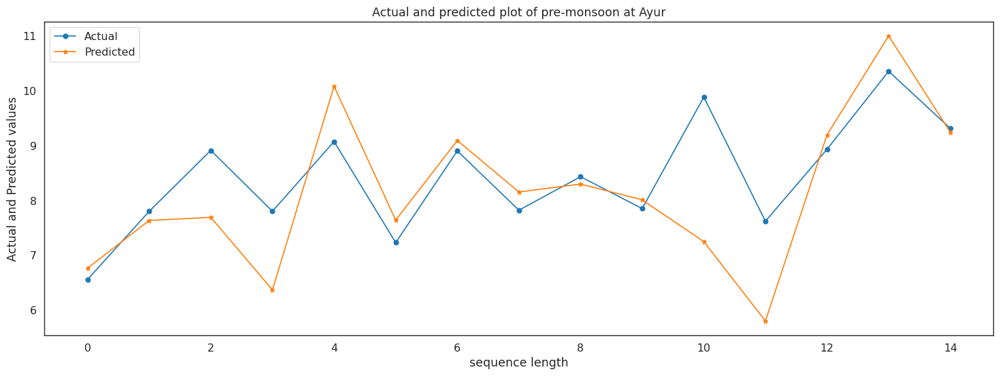

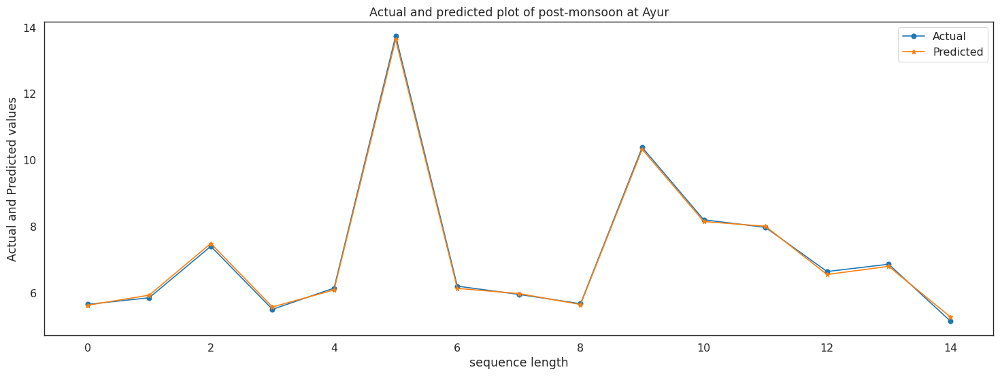

Epoch 1/100
1/1 - 2s - loss: 92.6019 - accuracy: 0.0000e+00 - 2s/epoch - 2s/step
Epoch 2/100
1/1 - 0s - loss: 90.1898 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 3/100
1/1 - 0s - loss: 87.8763 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 4/100
1/1 - 0s - loss: 85.6451 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 5/100
1/1 - 0s - loss: 83.4766 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 6/100
1/1 - 0s - loss: 81.3547 - accuracy: 0.0000e+00 - 14ms/epoch - 14ms/step
Epoch 7/100
1/1 - 0s - loss: 79.2653 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 8/100
1/1 - 0s - loss: 77.1955 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 9/100
1/1 - 0s - loss: 75.1339 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 10/100
1/1 - 0s - loss: 73.0709 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 11/100
1/1 - 0s - loss: 70.9983 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 12/100
1/1 - 0s - loss: 68.9568 - accuracy: 0.0000e+00 - 13ms

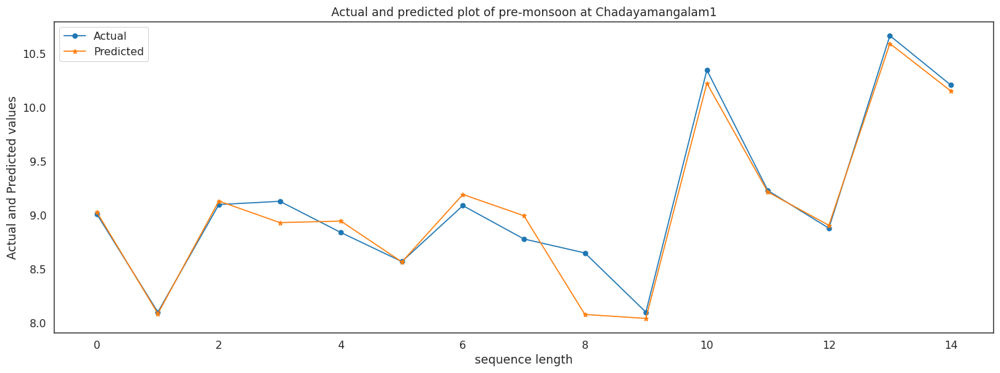

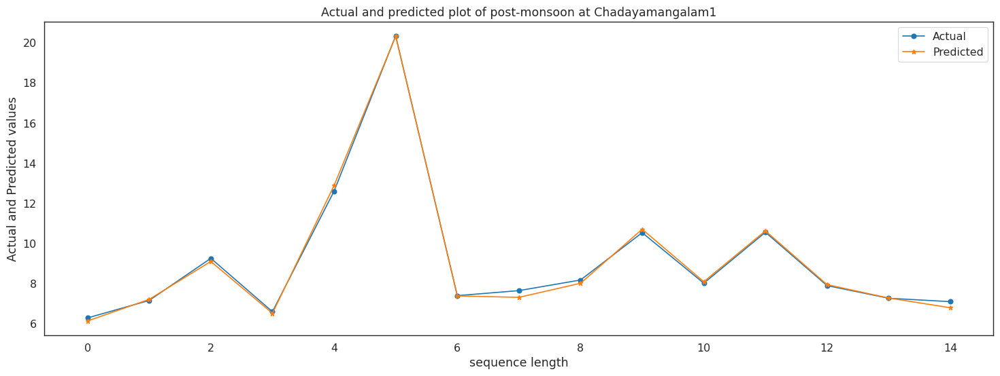

Epoch 1/100
1/1 - 2s - loss: 159.6895 - accuracy: 0.0000e+00 - 2s/epoch - 2s/step
Epoch 2/100
1/1 - 0s - loss: 155.2375 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 3/100
1/1 - 0s - loss: 151.1585 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 4/100
1/1 - 0s - loss: 147.4586 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 5/100
1/1 - 0s - loss: 144.0192 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 6/100
1/1 - 0s - loss: 140.7433 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 7/100
1/1 - 0s - loss: 137.5669 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 8/100
1/1 - 0s - loss: 134.4353 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 9/100
1/1 - 0s - loss: 131.3467 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 10/100
1/1 - 0s - loss: 128.2046 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 11/100
1/1 - 0s - loss: 125.0106 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 12/100
1/1 - 0s - loss: 121.6850 - accuracy: 0.0000e+00 

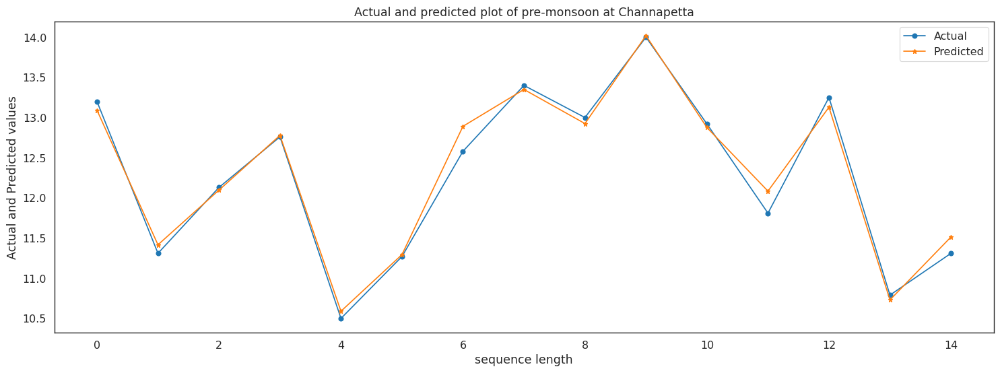

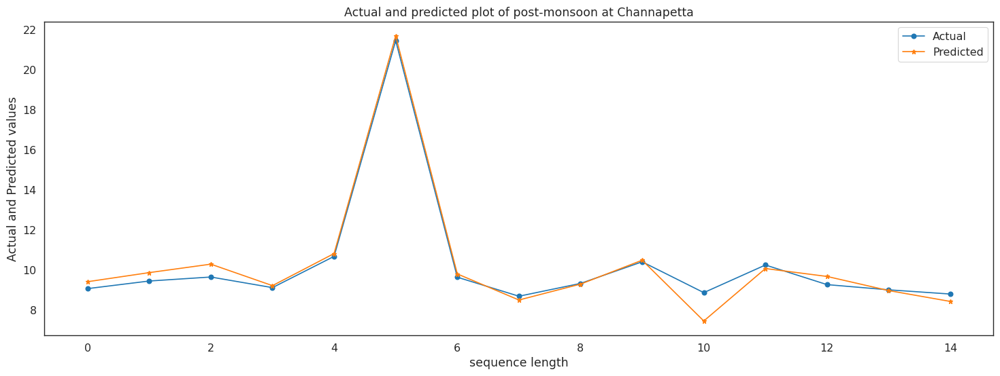

Epoch 1/100
1/1 - 3s - loss: 29.8623 - accuracy: 0.0000e+00 - 3s/epoch - 3s/step
Epoch 2/100
1/1 - 0s - loss: 29.3296 - accuracy: 0.0000e+00 - 17ms/epoch - 17ms/step
Epoch 3/100
1/1 - 0s - loss: 28.7925 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 4/100
1/1 - 0s - loss: 28.2464 - accuracy: 0.0000e+00 - 8ms/epoch - 8ms/step
Epoch 5/100
1/1 - 0s - loss: 27.6917 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 6/100
1/1 - 0s - loss: 27.1240 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 7/100
1/1 - 0s - loss: 26.5374 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 8/100
1/1 - 0s - loss: 25.9283 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 9/100
1/1 - 0s - loss: 25.2943 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 10/100
1/1 - 0s - loss: 24.6337 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 11/100
1/1 - 0s - loss: 23.9463 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 12/100
1/1 - 0s - loss: 23.2324 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/st

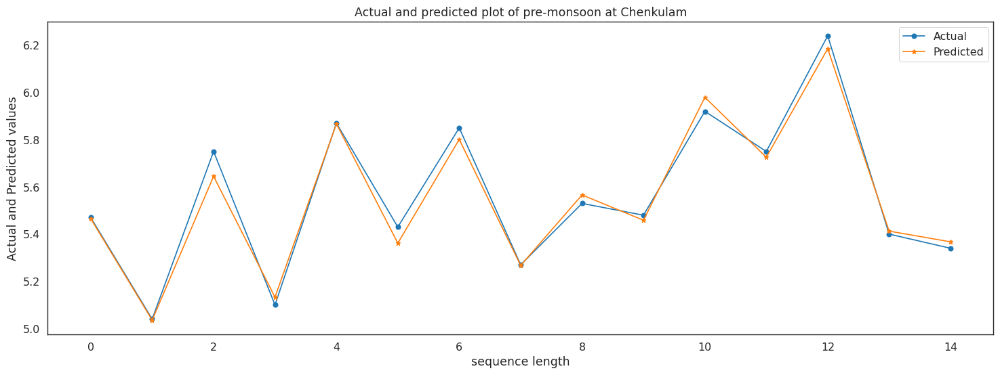

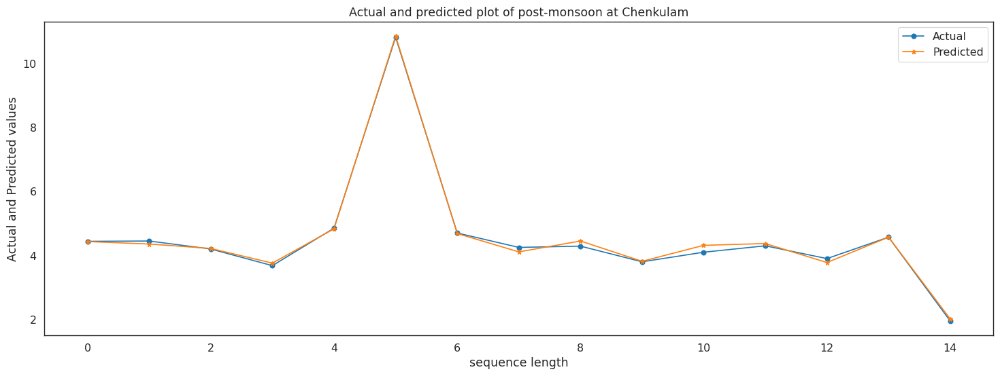

Epoch 1/100
1/1 - 3s - loss: 52.9044 - accuracy: 0.0000e+00 - 3s/epoch - 3s/step
Epoch 2/100
1/1 - 0s - loss: 52.1659 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 3/100
1/1 - 0s - loss: 51.4695 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 4/100
1/1 - 0s - loss: 50.8053 - accuracy: 0.0000e+00 - 8ms/epoch - 8ms/step
Epoch 5/100
1/1 - 0s - loss: 50.1639 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 6/100
1/1 - 0s - loss: 49.5366 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 7/100
1/1 - 0s - loss: 48.9147 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 8/100
1/1 - 0s - loss: 48.2899 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 9/100
1/1 - 0s - loss: 47.6580 - accuracy: 0.0000e+00 - 8ms/epoch - 8ms/step
Epoch 10/100
1/1 - 0s - loss: 47.0107 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 11/100
1/1 - 0s - loss: 46.3419 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 12/100
1/1 - 0s - loss: 45.6402 - accuracy: 0.0000e+00 - 12ms/epoch - 1

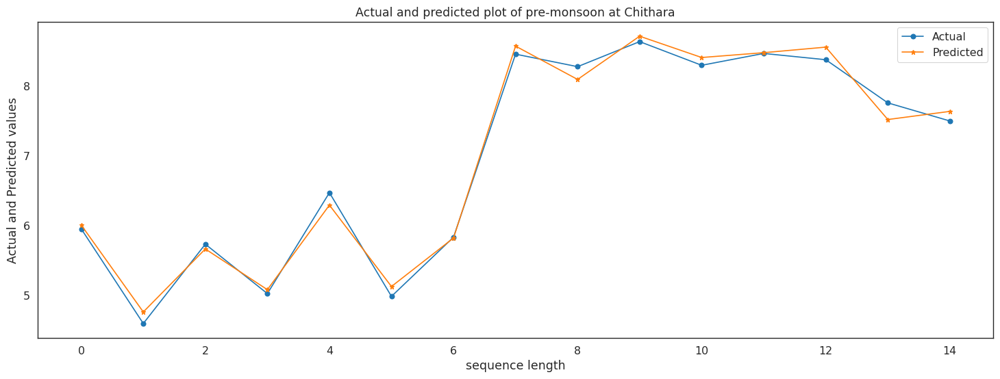

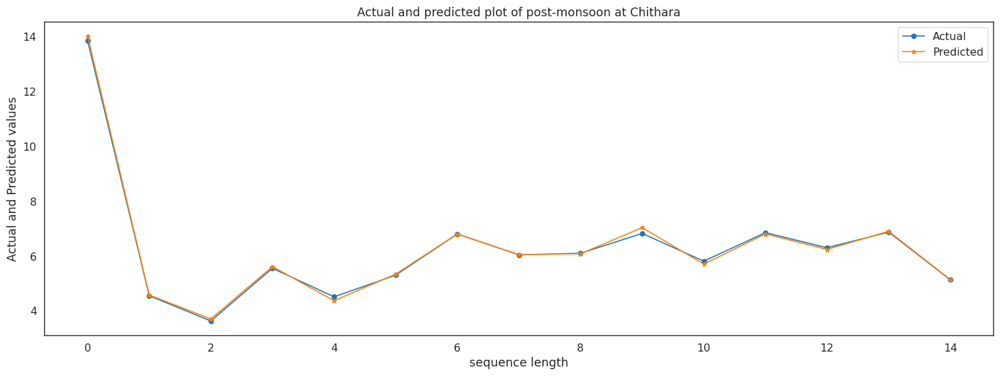

Epoch 1/100
1/1 - 4s - loss: 97.5000 - accuracy: 0.0000e+00 - 4s/epoch - 4s/step
Epoch 2/100
1/1 - 0s - loss: 95.6179 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 3/100
1/1 - 0s - loss: 93.7812 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 4/100
1/1 - 0s - loss: 91.9864 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 5/100
1/1 - 0s - loss: 90.2290 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 6/100
1/1 - 0s - loss: 88.5081 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 7/100
1/1 - 0s - loss: 86.8223 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 8/100
1/1 - 0s - loss: 85.1570 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 9/100
1/1 - 0s - loss: 83.5086 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 10/100
1/1 - 0s - loss: 81.8738 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 11/100
1/1 - 0s - loss: 80.2490 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 12/100
1/1 - 0s - loss: 78.6312 - accuracy: 0.0000e+00 - 10ms/epoch

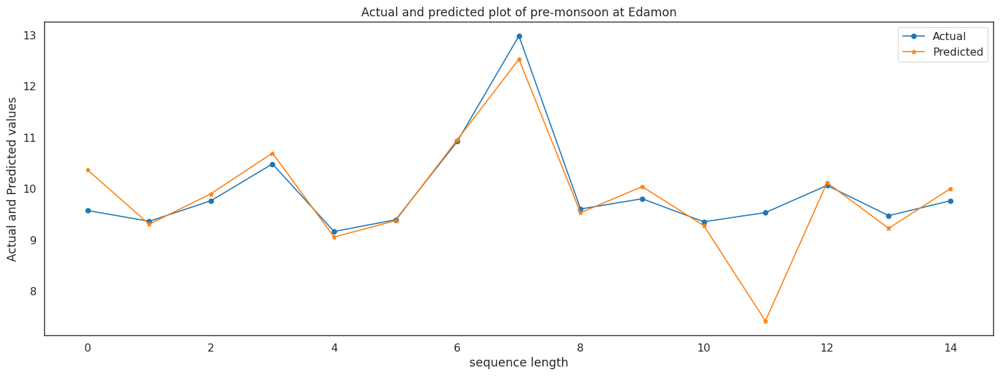

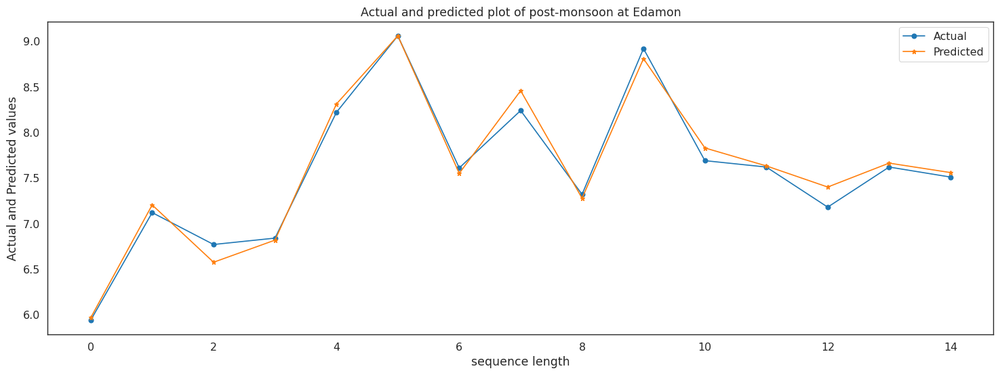

Epoch 1/100
1/1 - 3s - loss: 17.0327 - accuracy: 0.0000e+00 - 3s/epoch - 3s/step
Epoch 2/100
1/1 - 0s - loss: 16.5823 - accuracy: 0.0000e+00 - 14ms/epoch - 14ms/step
Epoch 3/100
1/1 - 0s - loss: 16.1355 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 4/100
1/1 - 0s - loss: 15.6917 - accuracy: 0.0000e+00 - 14ms/epoch - 14ms/step
Epoch 5/100
1/1 - 0s - loss: 15.2463 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 6/100
1/1 - 0s - loss: 14.7979 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 7/100
1/1 - 0s - loss: 14.3453 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 8/100
1/1 - 0s - loss: 13.8872 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 9/100
1/1 - 0s - loss: 13.4232 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 10/100
1/1 - 0s - loss: 12.9560 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 11/100
1/1 - 0s - loss: 12.4803 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 12/100
1/1 - 0s - loss: 11.9970 - accuracy: 0.0000e+00 - 11ms/epo

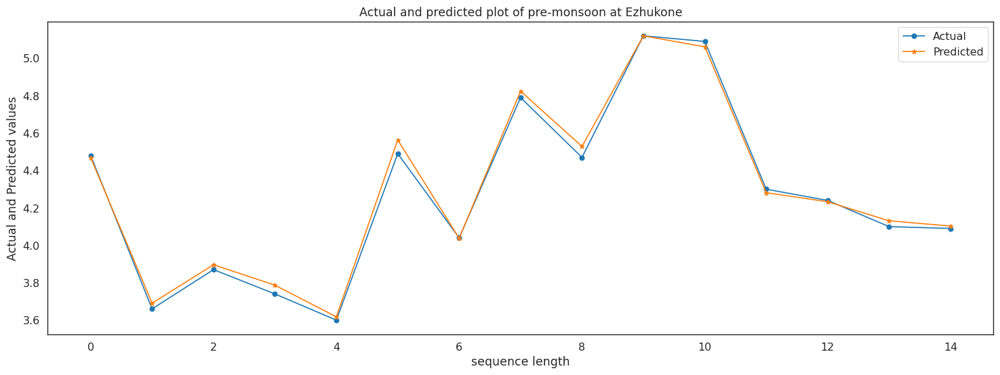

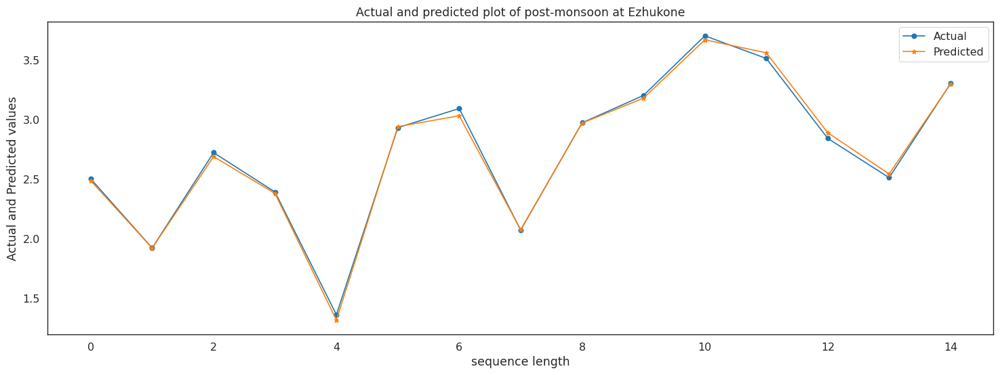

Epoch 1/100
1/1 - 2s - loss: 10.8891 - accuracy: 0.0000e+00 - 2s/epoch - 2s/step
Epoch 2/100
1/1 - 0s - loss: 10.7621 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 3/100
1/1 - 0s - loss: 10.6338 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 4/100
1/1 - 0s - loss: 10.5039 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 5/100
1/1 - 0s - loss: 10.3717 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 6/100
1/1 - 0s - loss: 10.2372 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 7/100
1/1 - 0s - loss: 10.0991 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 8/100
1/1 - 0s - loss: 9.9566 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 9/100
1/1 - 0s - loss: 9.8093 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 10/100
1/1 - 0s - loss: 9.6569 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 11/100
1/1 - 0s - loss: 9.4990 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 12/100
1/1 - 0s - loss: 9.3353 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step


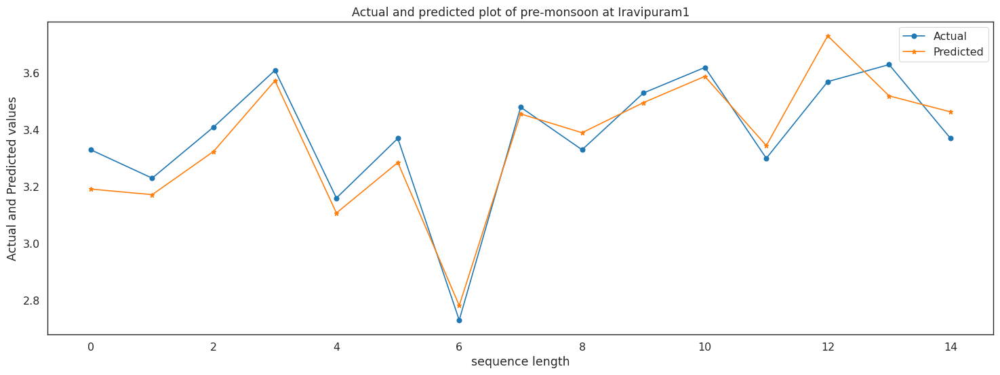

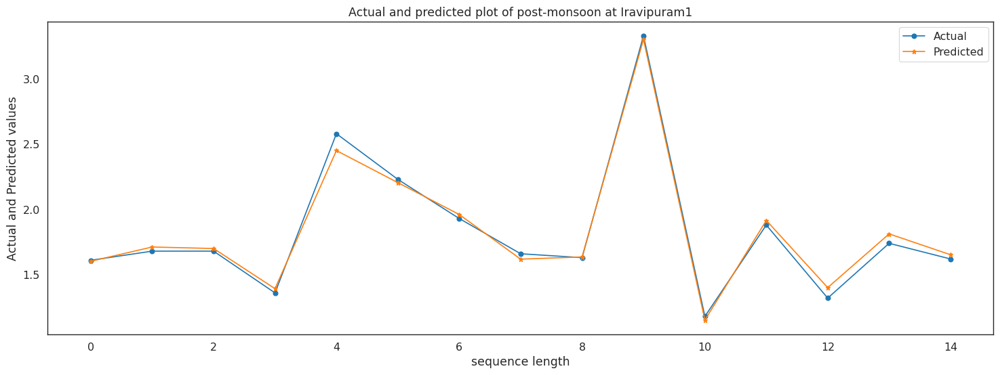

Epoch 1/100
1/1 - 2s - loss: 277.1781 - accuracy: 0.0000e+00 - 2s/epoch - 2s/step
Epoch 2/100
1/1 - 0s - loss: 269.8374 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 3/100
1/1 - 0s - loss: 262.7069 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 4/100
1/1 - 0s - loss: 255.7784 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 5/100
1/1 - 0s - loss: 249.0428 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 6/100
1/1 - 0s - loss: 242.4974 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 7/100
1/1 - 0s - loss: 236.1411 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 8/100
1/1 - 0s - loss: 229.9725 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 9/100
1/1 - 0s - loss: 223.9885 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 10/100
1/1 - 0s - loss: 218.1870 - accuracy: 0.0000e+00 - 8ms/epoch - 8ms/step
Epoch 11/100
1/1 - 0s - loss: 212.5700 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 12/100
1/1 - 0s - loss: 207.1473 - accuracy: 0.0000e+00 - 9ms/epoc

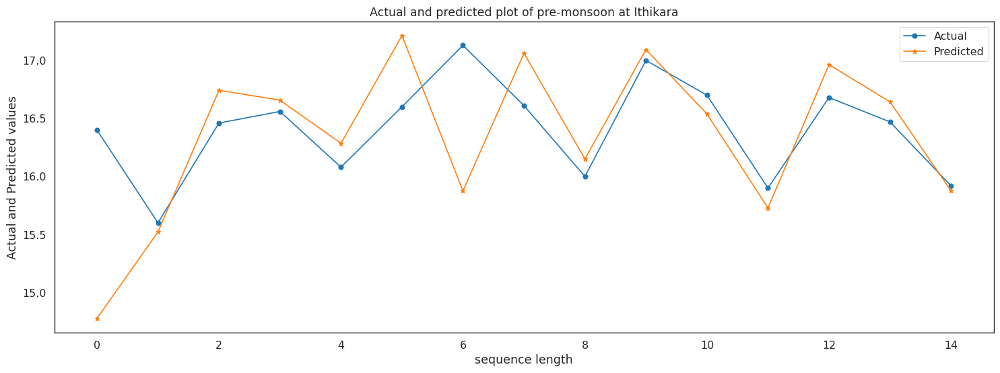

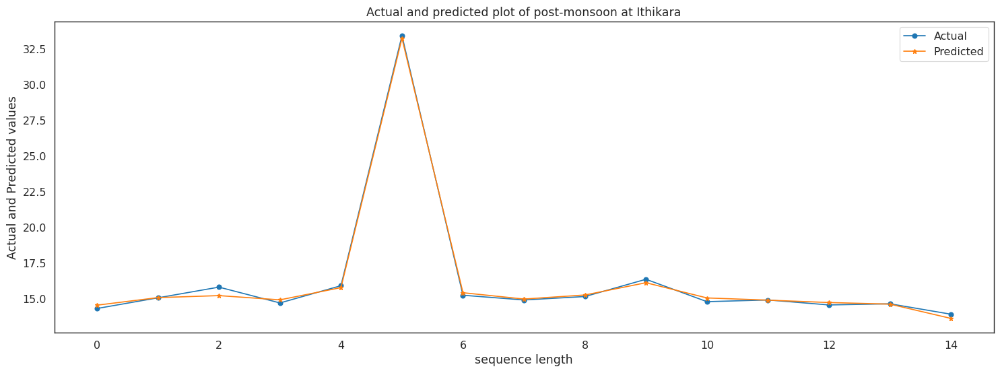

Epoch 1/100
1/1 - 3s - loss: 56.7166 - accuracy: 0.0000e+00 - 3s/epoch - 3s/step
Epoch 2/100
1/1 - 0s - loss: 55.6574 - accuracy: 0.0000e+00 - 15ms/epoch - 15ms/step
Epoch 3/100
1/1 - 0s - loss: 54.6118 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 4/100
1/1 - 0s - loss: 53.5740 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 5/100
1/1 - 0s - loss: 52.5372 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 6/100
1/1 - 0s - loss: 51.4952 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 7/100
1/1 - 0s - loss: 50.4438 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 8/100
1/1 - 0s - loss: 49.3919 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 9/100
1/1 - 0s - loss: 48.3139 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 10/100
1/1 - 0s - loss: 47.2125 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 11/100
1/1 - 0s - loss: 46.0799 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 12/100
1/1 - 0s - loss: 44.9061 - accuracy: 0.0000e+00 - 10ms/e

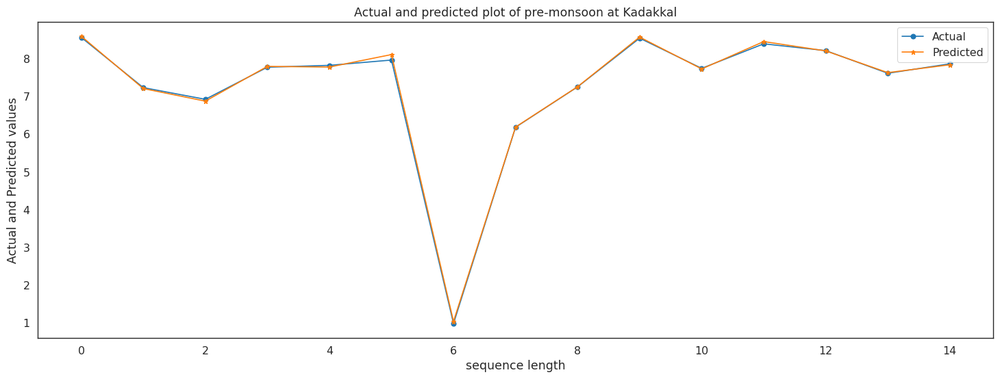

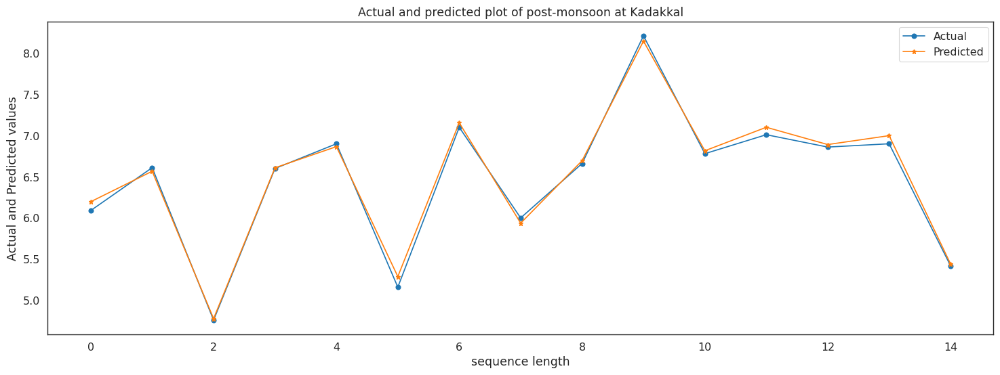

Epoch 1/100
1/1 - 2s - loss: 6.3988 - accuracy: 0.0000e+00 - 2s/epoch - 2s/step
Epoch 2/100
1/1 - 0s - loss: 6.2649 - accuracy: 0.0000e+00 - 15ms/epoch - 15ms/step
Epoch 3/100
1/1 - 0s - loss: 6.1364 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 4/100
1/1 - 0s - loss: 6.0166 - accuracy: 0.0000e+00 - 15ms/epoch - 15ms/step
Epoch 5/100
1/1 - 0s - loss: 5.8989 - accuracy: 0.0000e+00 - 15ms/epoch - 15ms/step
Epoch 6/100
1/1 - 0s - loss: 5.7820 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 7/100
1/1 - 0s - loss: 5.6655 - accuracy: 0.0000e+00 - 16ms/epoch - 16ms/step
Epoch 8/100
1/1 - 0s - loss: 5.5490 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 9/100
1/1 - 0s - loss: 5.4322 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 10/100
1/1 - 0s - loss: 5.3157 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 11/100
1/1 - 0s - loss: 5.1998 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 12/100
1/1 - 0s - loss: 5.0820 - accuracy: 0.0000e+00 - 12ms/epoch - 12m

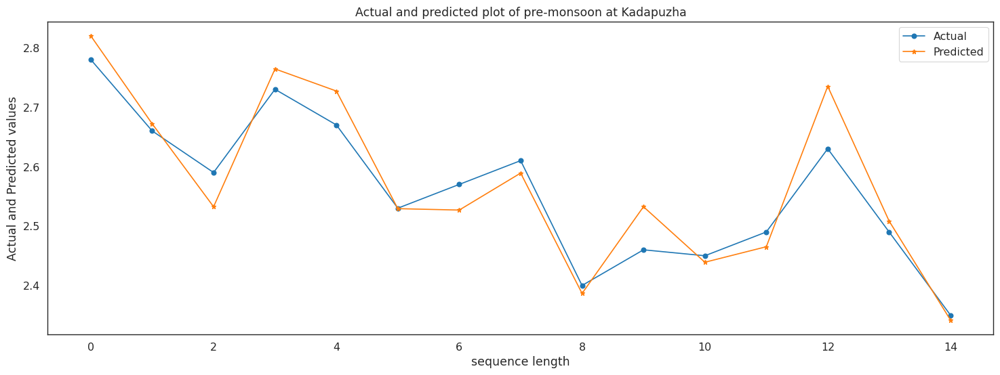

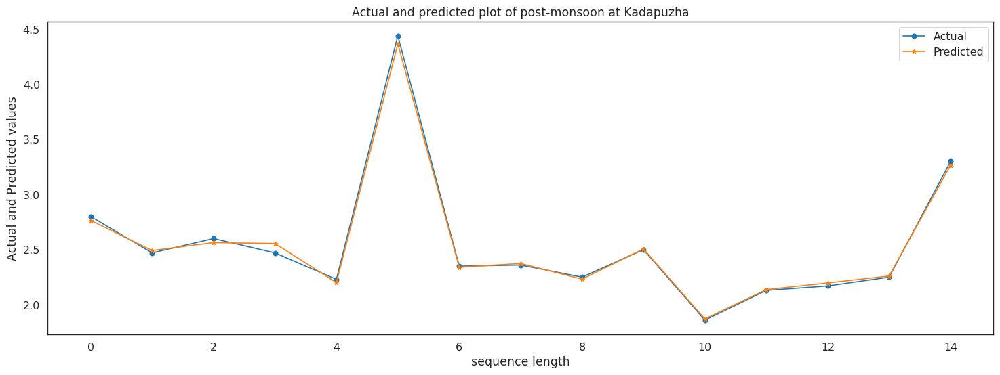

Epoch 1/100
1/1 - 2s - loss: 95.3620 - accuracy: 0.0000e+00 - 2s/epoch - 2s/step
Epoch 2/100
1/1 - 0s - loss: 92.1359 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 3/100
1/1 - 0s - loss: 89.0181 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 4/100
1/1 - 0s - loss: 86.0051 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 5/100
1/1 - 0s - loss: 83.0838 - accuracy: 0.0000e+00 - 14ms/epoch - 14ms/step
Epoch 6/100
1/1 - 0s - loss: 80.2472 - accuracy: 1.0000 - 13ms/epoch - 13ms/step
Epoch 7/100
1/1 - 0s - loss: 77.4879 - accuracy: 1.0000 - 11ms/epoch - 11ms/step
Epoch 8/100
1/1 - 0s - loss: 74.7978 - accuracy: 1.0000 - 11ms/epoch - 11ms/step
Epoch 9/100
1/1 - 0s - loss: 72.1685 - accuracy: 1.0000 - 10ms/epoch - 10ms/step
Epoch 10/100
1/1 - 0s - loss: 69.6185 - accuracy: 1.0000 - 13ms/epoch - 13ms/step
Epoch 11/100
1/1 - 0s - loss: 67.3105 - accuracy: 1.0000 - 9ms/epoch - 9ms/step
Epoch 12/100
1/1 - 0s - loss: 65.0176 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 13/10

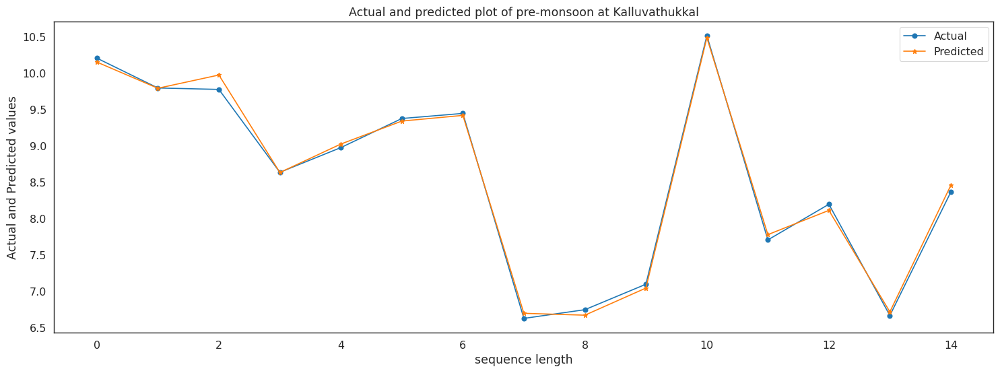

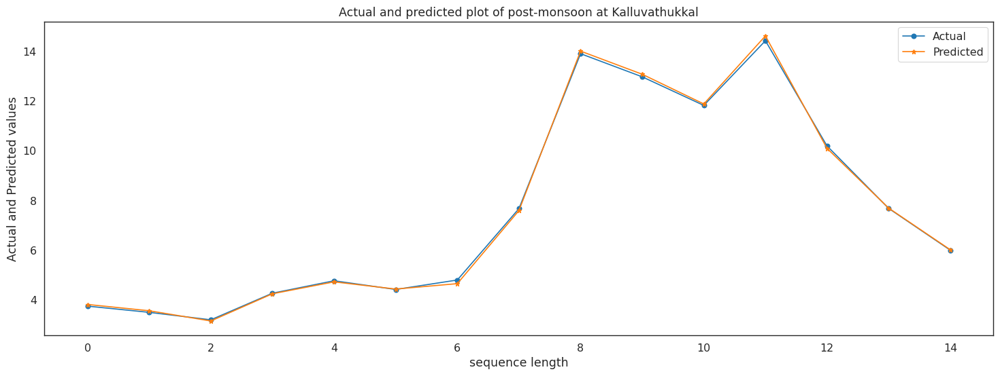

Epoch 1/100
1/1 - 3s - loss: 11.1209 - accuracy: 0.0000e+00 - 3s/epoch - 3s/step
Epoch 2/100
1/1 - 0s - loss: 11.0073 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 3/100
1/1 - 0s - loss: 10.8986 - accuracy: 0.0000e+00 - 14ms/epoch - 14ms/step
Epoch 4/100
1/1 - 0s - loss: 10.7915 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 5/100
1/1 - 0s - loss: 10.6872 - accuracy: 0.0000e+00 - 8ms/epoch - 8ms/step
Epoch 6/100
1/1 - 0s - loss: 10.5822 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 7/100
1/1 - 0s - loss: 10.4758 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 8/100
1/1 - 0s - loss: 10.3674 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 9/100
1/1 - 0s - loss: 10.2564 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 10/100
1/1 - 0s - loss: 10.1422 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 11/100
1/1 - 0s - loss: 10.0243 - accuracy: 0.0000e+00 - 14ms/epoch - 14ms/step
Epoch 12/100
1/1 - 0s - loss: 9.9021 - accuracy: 0.0000e+00 - 11ms/epoch 

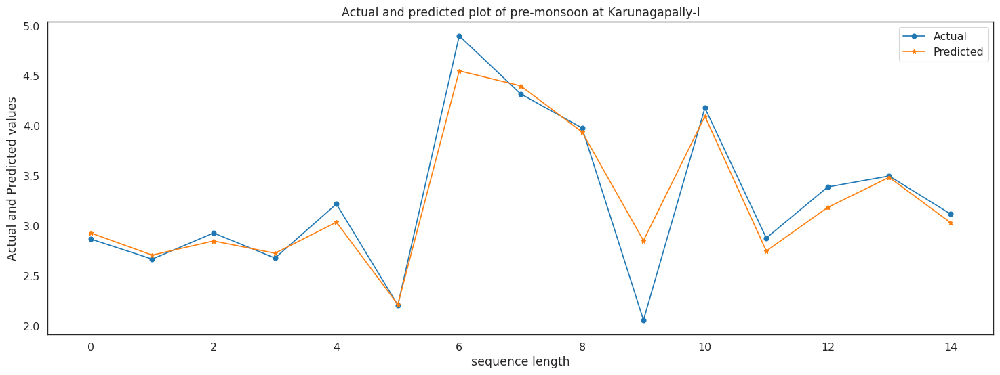

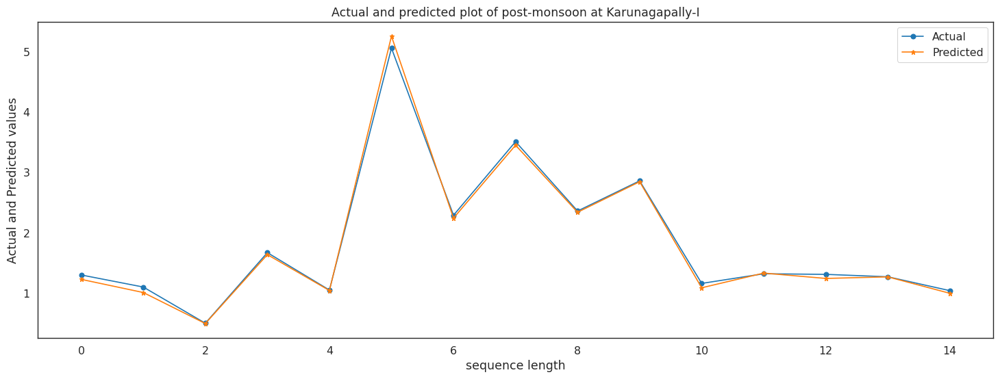

Epoch 1/100
1/1 - 3s - loss: 274.0299 - accuracy: 0.0000e+00 - 3s/epoch - 3s/step
Epoch 2/100
1/1 - 0s - loss: 269.0920 - accuracy: 0.0000e+00 - 14ms/epoch - 14ms/step
Epoch 3/100
1/1 - 0s - loss: 264.3768 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 4/100
1/1 - 0s - loss: 259.7762 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 5/100
1/1 - 0s - loss: 255.2040 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 6/100
1/1 - 0s - loss: 250.5982 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 7/100
1/1 - 0s - loss: 245.9172 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 8/100
1/1 - 0s - loss: 241.1361 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 9/100
1/1 - 0s - loss: 236.2389 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 10/100
1/1 - 0s - loss: 231.2090 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 11/100
1/1 - 0s - loss: 226.0527 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 12/100
1/1 - 0s - loss: 220.7700 - accuracy: 0.0000e+00 

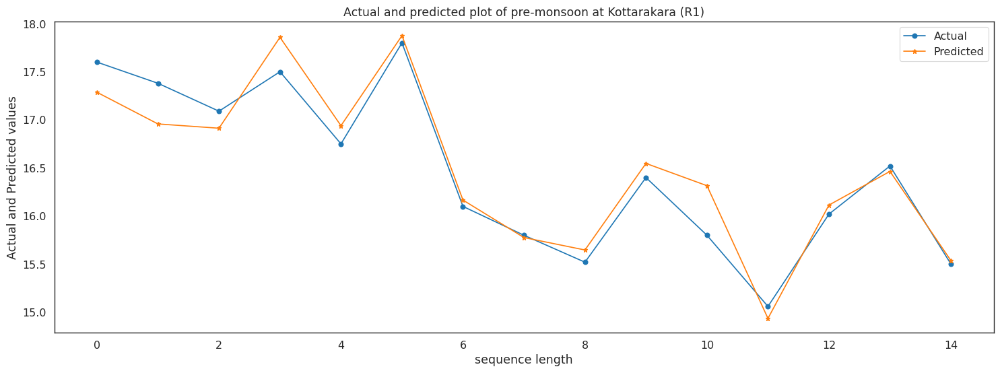

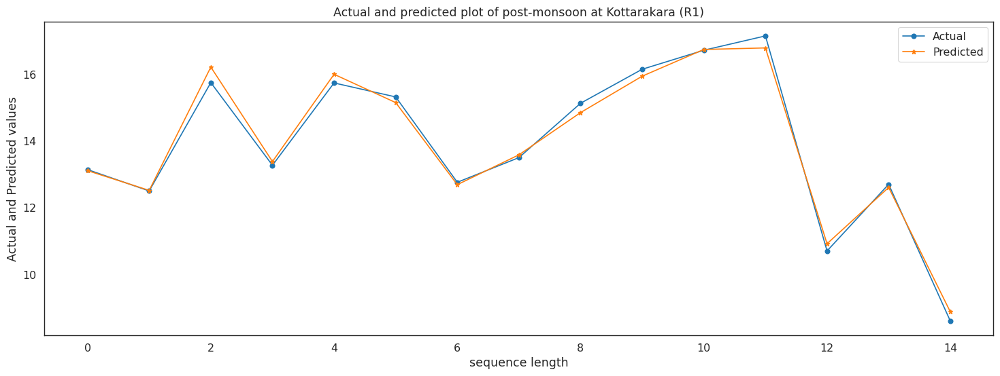

Epoch 1/100
1/1 - 2s - loss: 57.3374 - accuracy: 0.0000e+00 - 2s/epoch - 2s/step
Epoch 2/100
1/1 - 0s - loss: 56.2496 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 3/100
1/1 - 0s - loss: 55.2457 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 4/100
1/1 - 0s - loss: 54.3094 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 5/100
1/1 - 0s - loss: 53.4001 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 6/100
1/1 - 0s - loss: 52.5127 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 7/100
1/1 - 0s - loss: 51.6489 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 8/100
1/1 - 0s - loss: 50.7953 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 9/100
1/1 - 0s - loss: 49.9455 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 10/100
1/1 - 0s - loss: 49.0941 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 11/100
1/1 - 0s - loss: 48.2354 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 12/100
1/1 - 0s - loss: 47.3638 - accuracy: 0.0000e+00 - 9ms/epoch 

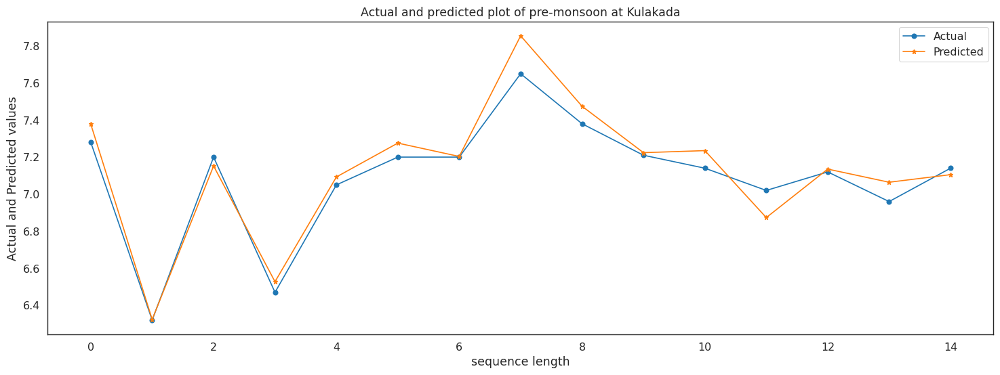

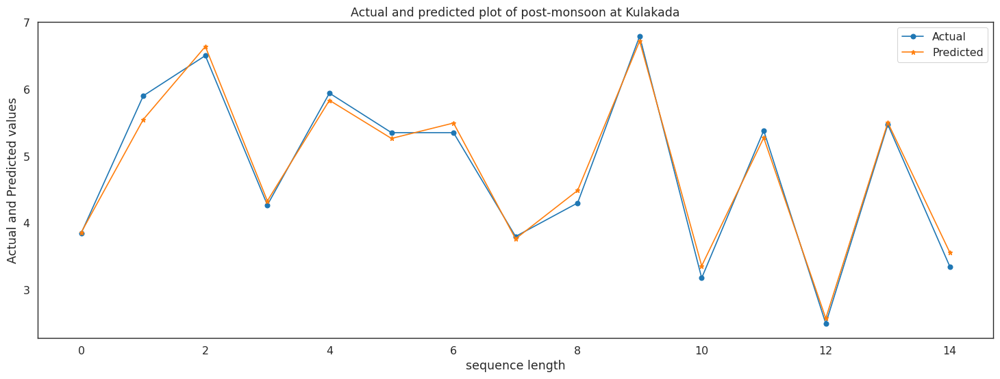

Epoch 1/100
1/1 - 2s - loss: 39.7649 - accuracy: 0.0000e+00 - 2s/epoch - 2s/step
Epoch 2/100
1/1 - 0s - loss: 38.7632 - accuracy: 0.0000e+00 - 14ms/epoch - 14ms/step
Epoch 3/100
1/1 - 0s - loss: 37.7863 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 4/100
1/1 - 0s - loss: 36.8352 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 5/100
1/1 - 0s - loss: 35.9048 - accuracy: 0.0000e+00 - 15ms/epoch - 15ms/step
Epoch 6/100
1/1 - 0s - loss: 34.9915 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 7/100
1/1 - 0s - loss: 34.0932 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 8/100
1/1 - 0s - loss: 33.2075 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 9/100
1/1 - 0s - loss: 32.3307 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 10/100
1/1 - 0s - loss: 31.4594 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 11/100
1/1 - 0s - loss: 30.5901 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 12/100
1/1 - 0s - loss: 29.7197 - accuracy: 0.0000e+00 - 11ms/epo

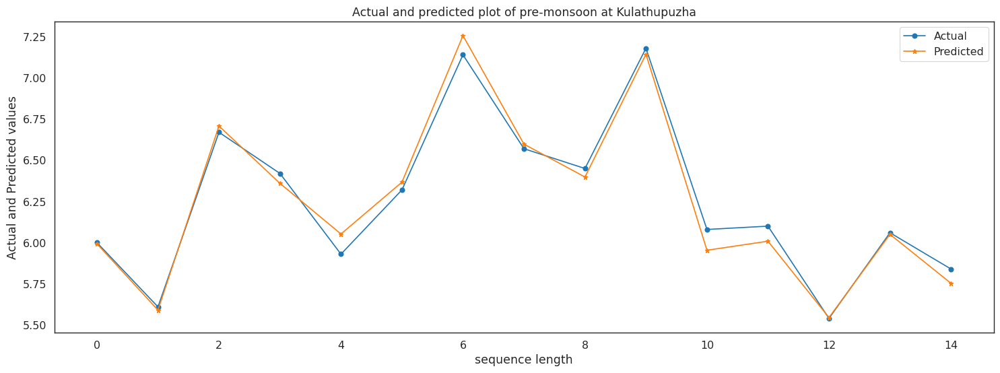

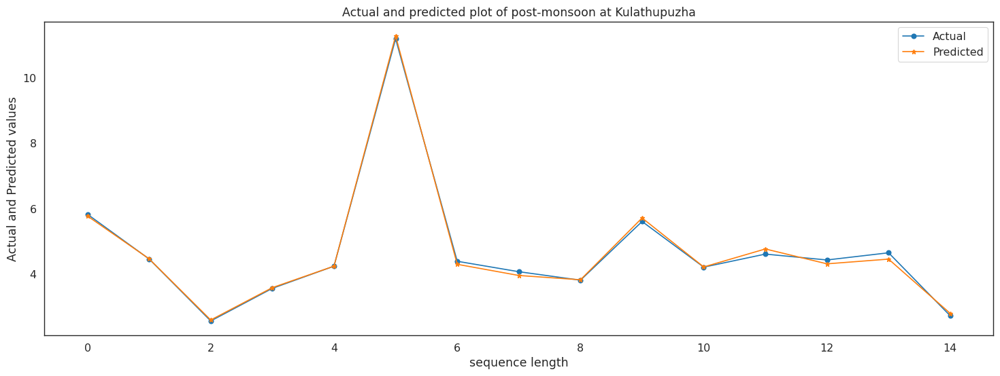

Epoch 1/100
1/1 - 4s - loss: 133.6207 - accuracy: 0.0000e+00 - 4s/epoch - 4s/step
Epoch 2/100
1/1 - 0s - loss: 130.5774 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 3/100
1/1 - 0s - loss: 127.6054 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 4/100
1/1 - 0s - loss: 124.6777 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 5/100
1/1 - 0s - loss: 121.7770 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 6/100
1/1 - 0s - loss: 118.8927 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 7/100
1/1 - 0s - loss: 116.0190 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 8/100
1/1 - 0s - loss: 113.1548 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 9/100
1/1 - 0s - loss: 110.3030 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 10/100
1/1 - 0s - loss: 107.4689 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 11/100
1/1 - 0s - loss: 104.6592 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 12/100
1/1 - 0s - loss: 101.8790 - accuracy: 0.0000e+00 - 9ms/

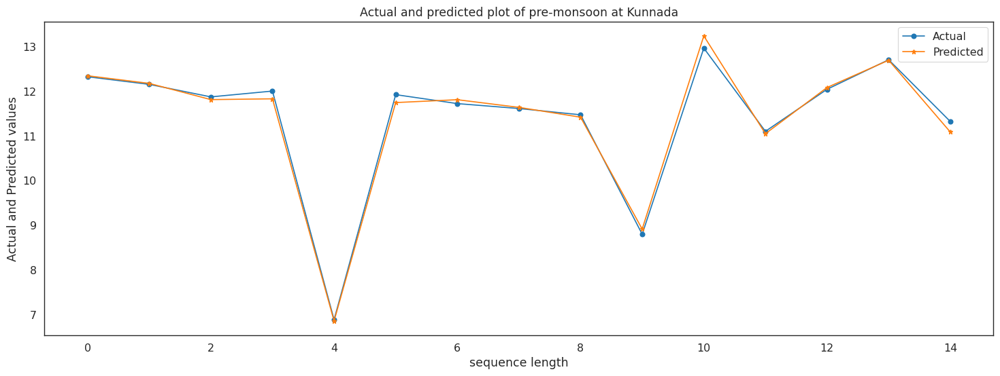

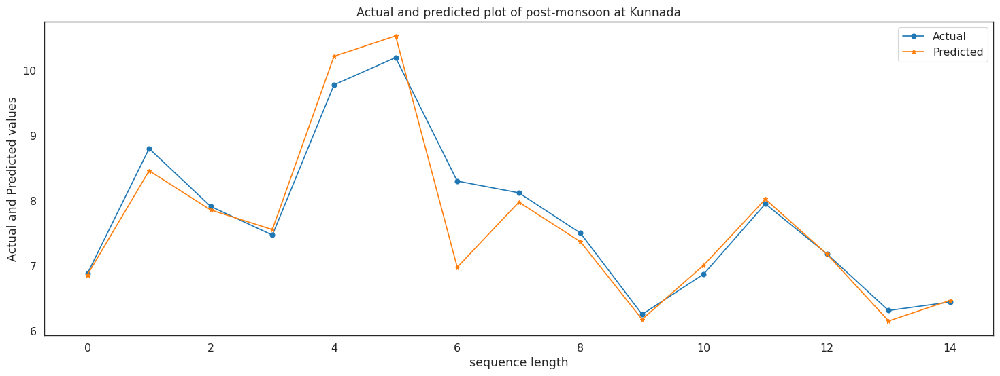

Epoch 1/100
1/1 - 3s - loss: 57.3327 - accuracy: 0.0000e+00 - 3s/epoch - 3s/step
Epoch 2/100
1/1 - 0s - loss: 56.1653 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 3/100
1/1 - 0s - loss: 55.1104 - accuracy: 0.0000e+00 - 14ms/epoch - 14ms/step
Epoch 4/100
1/1 - 0s - loss: 54.1731 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 5/100
1/1 - 0s - loss: 53.3152 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 6/100
1/1 - 0s - loss: 52.5254 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 7/100
1/1 - 0s - loss: 51.7937 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 8/100
1/1 - 0s - loss: 51.1144 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 9/100
1/1 - 0s - loss: 50.4743 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 10/100
1/1 - 0s - loss: 49.8614 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 11/100
1/1 - 0s - loss: 49.2667 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 12/100
1/1 - 0s - loss: 48.6814 - accuracy: 0.0000e+00 - 10ms/epoch

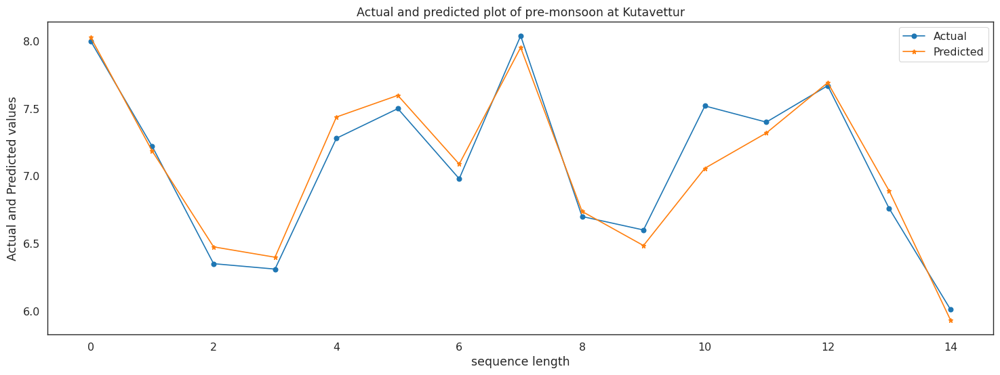

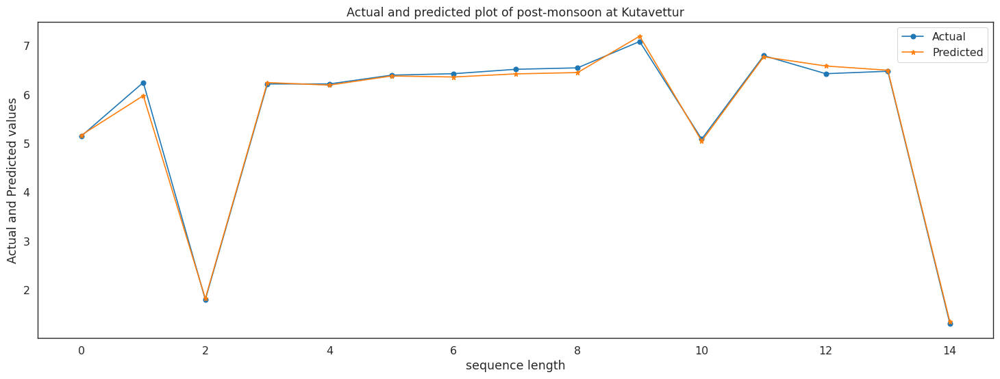

Epoch 1/100
1/1 - 3s - loss: 25.4760 - accuracy: 1.0000 - 3s/epoch - 3s/step
Epoch 2/100
1/1 - 0s - loss: 25.0030 - accuracy: 1.0000 - 10ms/epoch - 10ms/step
Epoch 3/100
1/1 - 0s - loss: 24.5329 - accuracy: 1.0000 - 10ms/epoch - 10ms/step
Epoch 4/100
1/1 - 0s - loss: 24.0771 - accuracy: 1.0000 - 9ms/epoch - 9ms/step
Epoch 5/100
1/1 - 0s - loss: 23.6246 - accuracy: 1.0000 - 12ms/epoch - 12ms/step
Epoch 6/100
1/1 - 0s - loss: 23.1744 - accuracy: 1.0000 - 9ms/epoch - 9ms/step
Epoch 7/100
1/1 - 0s - loss: 22.7134 - accuracy: 1.0000 - 10ms/epoch - 10ms/step
Epoch 8/100
1/1 - 0s - loss: 22.2397 - accuracy: 1.0000 - 9ms/epoch - 9ms/step
Epoch 9/100
1/1 - 0s - loss: 21.7512 - accuracy: 1.0000 - 9ms/epoch - 9ms/step
Epoch 10/100
1/1 - 0s - loss: 21.2460 - accuracy: 1.0000 - 10ms/epoch - 10ms/step
Epoch 11/100
1/1 - 0s - loss: 20.7222 - accuracy: 1.0000 - 11ms/epoch - 11ms/step
Epoch 12/100
1/1 - 0s - loss: 20.1780 - accuracy: 1.0000 - 9ms/epoch - 9ms/step
Epoch 13/100
1/1 - 0s - loss: 19.6118 -

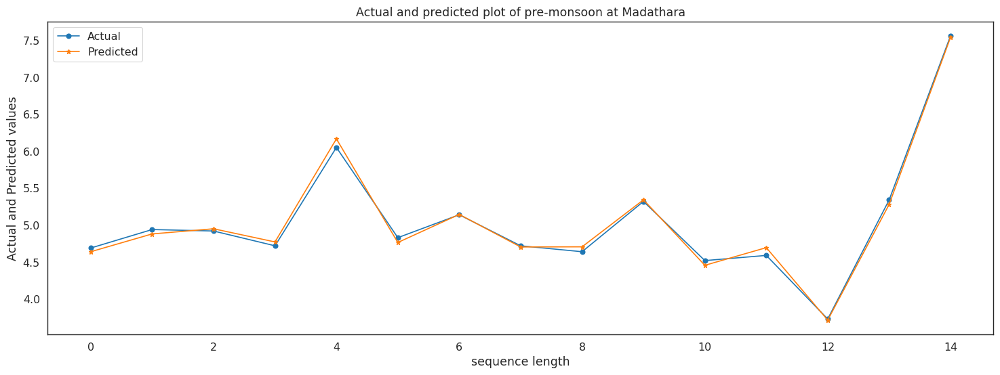

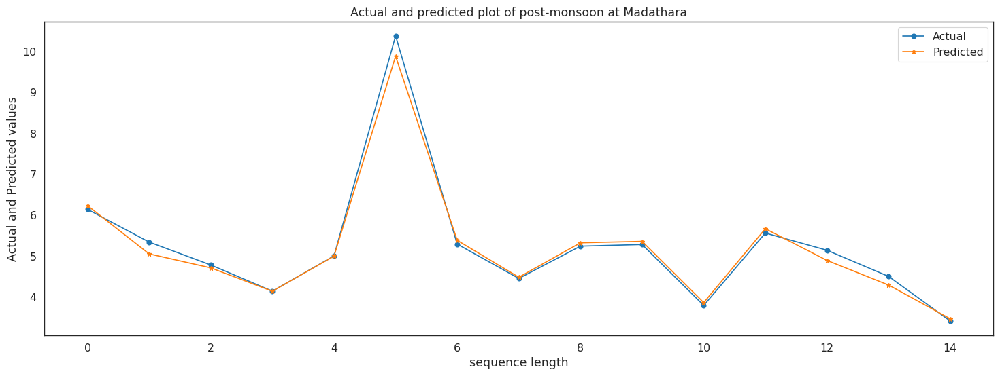

Epoch 1/100
1/1 - 3s - loss: 38.4513 - accuracy: 0.0000e+00 - 3s/epoch - 3s/step
Epoch 2/100
1/1 - 0s - loss: 37.5438 - accuracy: 0.0000e+00 - 14ms/epoch - 14ms/step
Epoch 3/100
1/1 - 0s - loss: 36.6720 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 4/100
1/1 - 0s - loss: 35.8309 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 5/100
1/1 - 0s - loss: 35.0146 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 6/100
1/1 - 0s - loss: 34.2176 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 7/100
1/1 - 0s - loss: 33.4339 - accuracy: 0.0000e+00 - 8ms/epoch - 8ms/step
Epoch 8/100
1/1 - 0s - loss: 32.6609 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 9/100
1/1 - 0s - loss: 31.9040 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 10/100
1/1 - 0s - loss: 31.1523 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 11/100
1/1 - 0s - loss: 30.3884 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 12/100
1/1 - 0s - loss: 29.6088 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/st

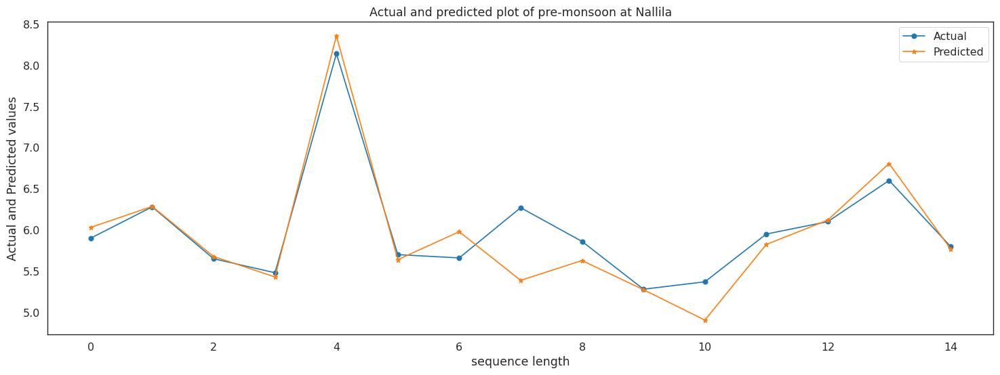

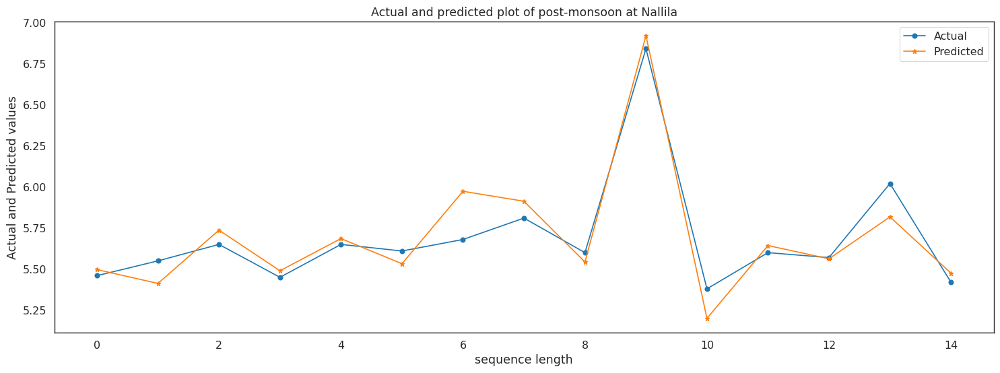

Epoch 1/100
1/1 - 3s - loss: 1.8875 - accuracy: 1.0000 - 3s/epoch - 3s/step
Epoch 2/100
1/1 - 0s - loss: 1.8622 - accuracy: 1.0000 - 13ms/epoch - 13ms/step
Epoch 3/100
1/1 - 0s - loss: 1.8375 - accuracy: 1.0000 - 11ms/epoch - 11ms/step
Epoch 4/100
1/1 - 0s - loss: 1.8131 - accuracy: 1.0000 - 11ms/epoch - 11ms/step
Epoch 5/100
1/1 - 0s - loss: 1.7894 - accuracy: 1.0000 - 12ms/epoch - 12ms/step
Epoch 6/100
1/1 - 0s - loss: 1.7662 - accuracy: 1.0000 - 12ms/epoch - 12ms/step
Epoch 7/100
1/1 - 0s - loss: 1.7437 - accuracy: 1.0000 - 11ms/epoch - 11ms/step
Epoch 8/100
1/1 - 0s - loss: 1.7214 - accuracy: 1.0000 - 10ms/epoch - 10ms/step
Epoch 9/100
1/1 - 0s - loss: 1.6990 - accuracy: 1.0000 - 10ms/epoch - 10ms/step
Epoch 10/100
1/1 - 0s - loss: 1.6763 - accuracy: 1.0000 - 10ms/epoch - 10ms/step
Epoch 11/100
1/1 - 0s - loss: 1.6535 - accuracy: 1.0000 - 10ms/epoch - 10ms/step
Epoch 12/100
1/1 - 0s - loss: 1.6303 - accuracy: 1.0000 - 18ms/epoch - 18ms/step
Epoch 13/100
1/1 - 0s - loss: 1.6070 - ac

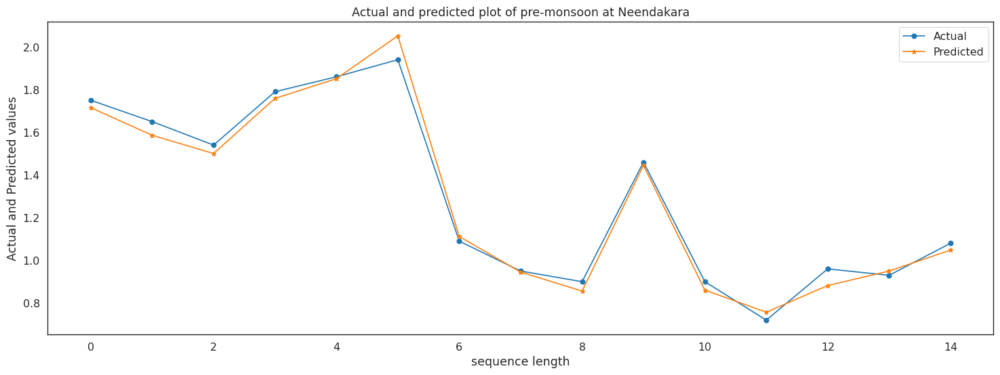

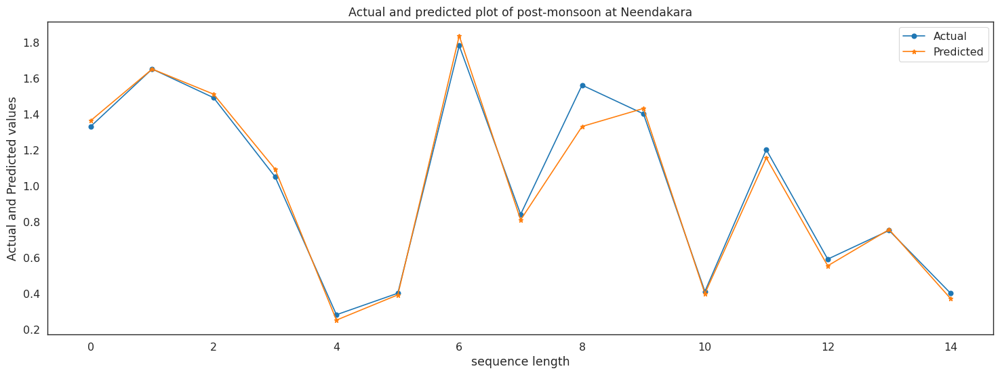

Epoch 1/100
1/1 - 3s - loss: 1.8829 - accuracy: 0.0000e+00 - 3s/epoch - 3s/step
Epoch 2/100
1/1 - 0s - loss: 1.8598 - accuracy: 0.0000e+00 - 18ms/epoch - 18ms/step
Epoch 3/100
1/1 - 0s - loss: 1.8366 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 4/100
1/1 - 0s - loss: 1.8130 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 5/100
1/1 - 0s - loss: 1.7890 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 6/100
1/1 - 0s - loss: 1.7643 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 7/100
1/1 - 0s - loss: 1.7391 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 8/100
1/1 - 0s - loss: 1.7133 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 9/100
1/1 - 0s - loss: 1.6868 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 10/100
1/1 - 0s - loss: 1.6596 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 11/100
1/1 - 0s - loss: 1.6316 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 12/100
1/1 - 0s - loss: 1.6028 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step

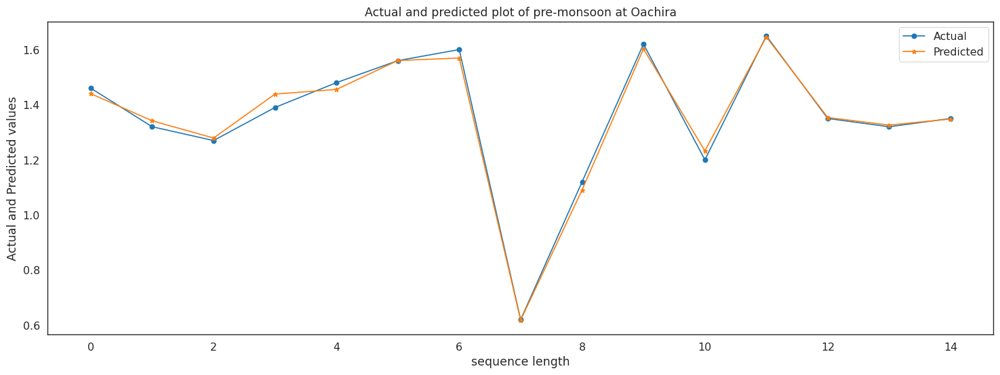

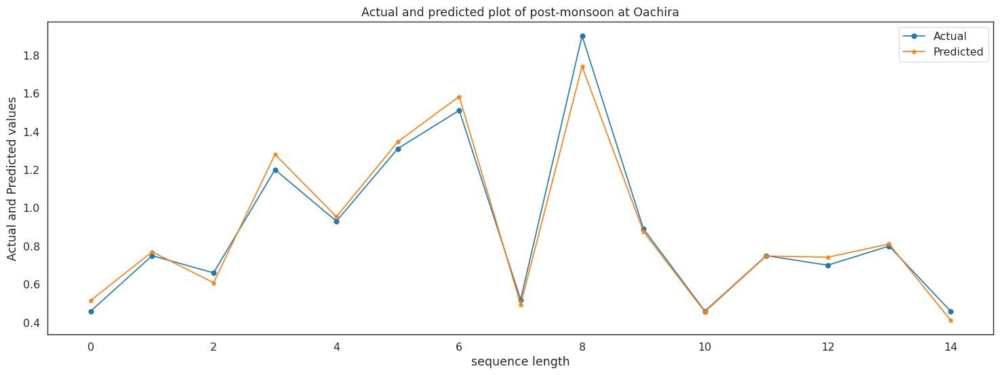

Epoch 1/100
1/1 - 2s - loss: 101.8679 - accuracy: 0.0000e+00 - 2s/epoch - 2s/step
Epoch 2/100
1/1 - 0s - loss: 99.4497 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 3/100
1/1 - 0s - loss: 97.0819 - accuracy: 0.0000e+00 - 14ms/epoch - 14ms/step
Epoch 4/100
1/1 - 0s - loss: 94.7594 - accuracy: 0.0000e+00 - 14ms/epoch - 14ms/step
Epoch 5/100
1/1 - 0s - loss: 92.4909 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 6/100
1/1 - 0s - loss: 90.2688 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 7/100
1/1 - 0s - loss: 88.0665 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 8/100
1/1 - 0s - loss: 85.8781 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 9/100
1/1 - 0s - loss: 83.6969 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 10/100
1/1 - 0s - loss: 81.5157 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 11/100
1/1 - 0s - loss: 79.3270 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 12/100
1/1 - 0s - loss: 77.1237 - accuracy: 0.0000e+00 - 10ms/

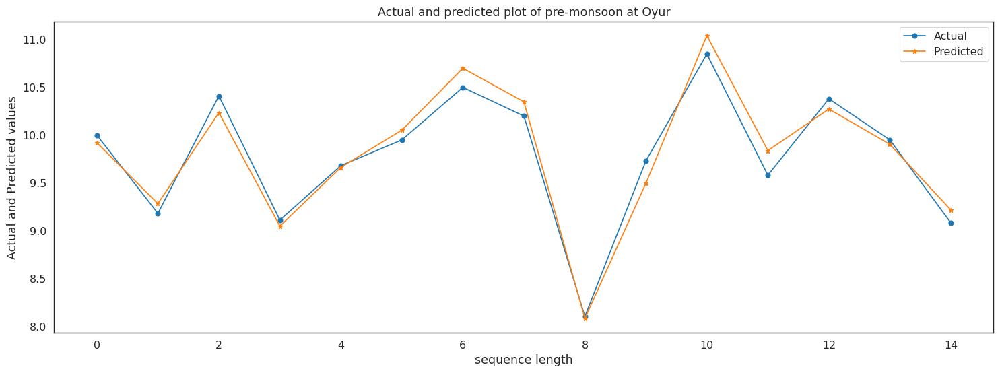

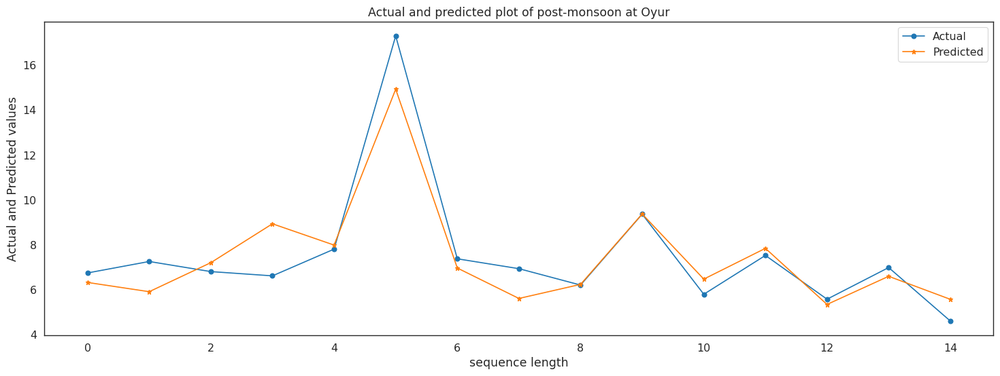

Epoch 1/100
1/1 - 4s - loss: 124.1510 - accuracy: 0.0000e+00 - 4s/epoch - 4s/step
Epoch 2/100
1/1 - 0s - loss: 122.7245 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 3/100
1/1 - 0s - loss: 121.3012 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 4/100
1/1 - 0s - loss: 119.8593 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 5/100
1/1 - 0s - loss: 118.3797 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 6/100
1/1 - 0s - loss: 116.8654 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 7/100
1/1 - 0s - loss: 115.2625 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 8/100
1/1 - 0s - loss: 113.5561 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 9/100
1/1 - 0s - loss: 111.7312 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 10/100
1/1 - 0s - loss: 109.7722 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 11/100
1/1 - 0s - loss: 107.6620 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 12/100
1/1 - 0s - loss: 105.3823 - accuracy: 0.0000e+0

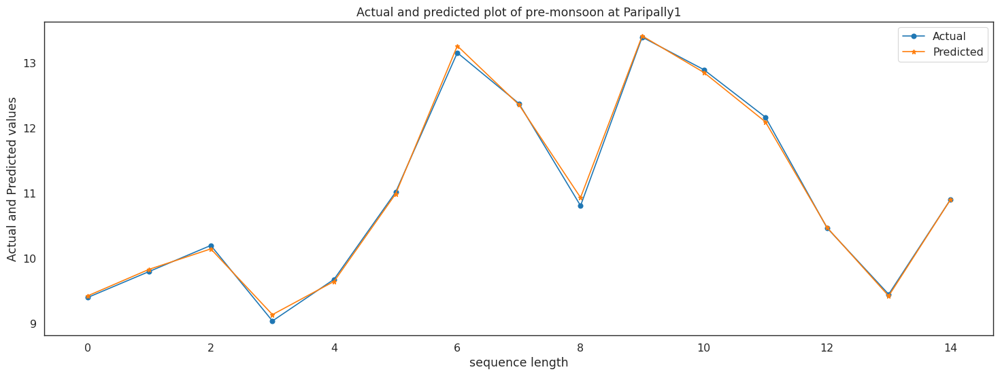

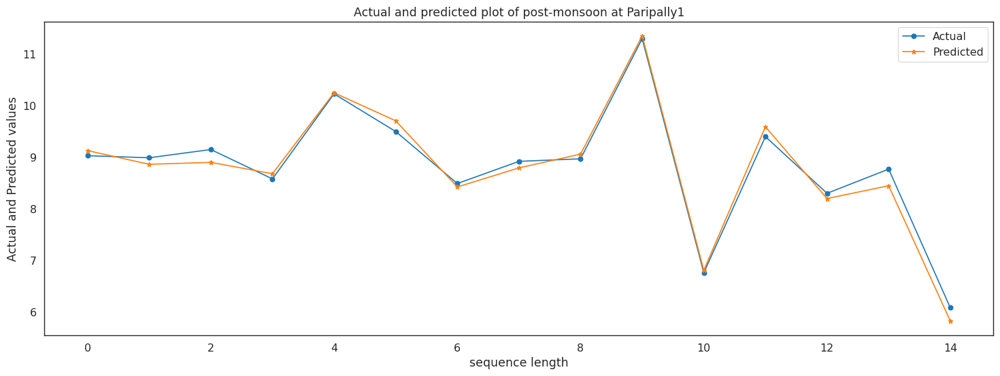

Epoch 1/100
1/1 - 3s - loss: 62.6640 - accuracy: 0.0000e+00 - 3s/epoch - 3s/step
Epoch 2/100
1/1 - 0s - loss: 62.1649 - accuracy: 0.0000e+00 - 15ms/epoch - 15ms/step
Epoch 3/100
1/1 - 0s - loss: 61.7140 - accuracy: 0.0000e+00 - 22ms/epoch - 22ms/step
Epoch 4/100
1/1 - 0s - loss: 61.3078 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 5/100
1/1 - 0s - loss: 60.8910 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 6/100
1/1 - 0s - loss: 60.4576 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 7/100
1/1 - 0s - loss: 60.0018 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 8/100
1/1 - 0s - loss: 59.5182 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 9/100
1/1 - 0s - loss: 59.0015 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 10/100
1/1 - 0s - loss: 58.4470 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 11/100
1/1 - 0s - loss: 57.8503 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 12/100
1/1 - 0s - loss: 57.2069 - accuracy: 0.0000e+00 - 10ms/epo

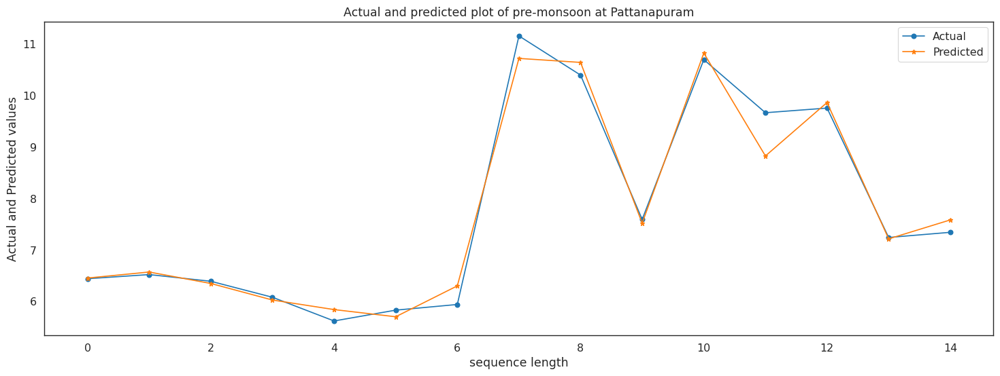

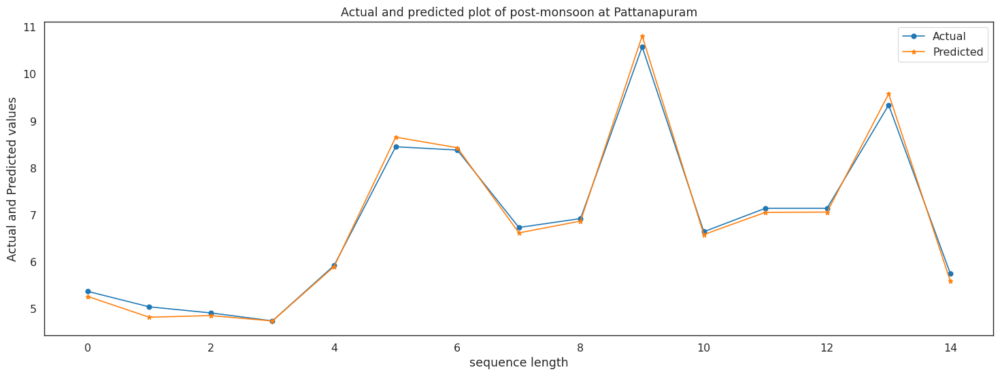

Epoch 1/100
1/1 - 2s - loss: 20.8195 - accuracy: 0.0000e+00 - 2s/epoch - 2s/step
Epoch 2/100
1/1 - 0s - loss: 20.4842 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 3/100
1/1 - 0s - loss: 20.1495 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 4/100
1/1 - 0s - loss: 19.8143 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 5/100
1/1 - 0s - loss: 19.4770 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 6/100
1/1 - 0s - loss: 19.1373 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 7/100
1/1 - 0s - loss: 18.7941 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 8/100
1/1 - 0s - loss: 18.4451 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 9/100
1/1 - 0s - loss: 18.0902 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 10/100
1/1 - 0s - loss: 17.7287 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 11/100
1/1 - 0s - loss: 17.3595 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 12/100
1/1 - 0s - loss: 16.9825 - accuracy: 0.0000e+00 - 9ms/epoch 

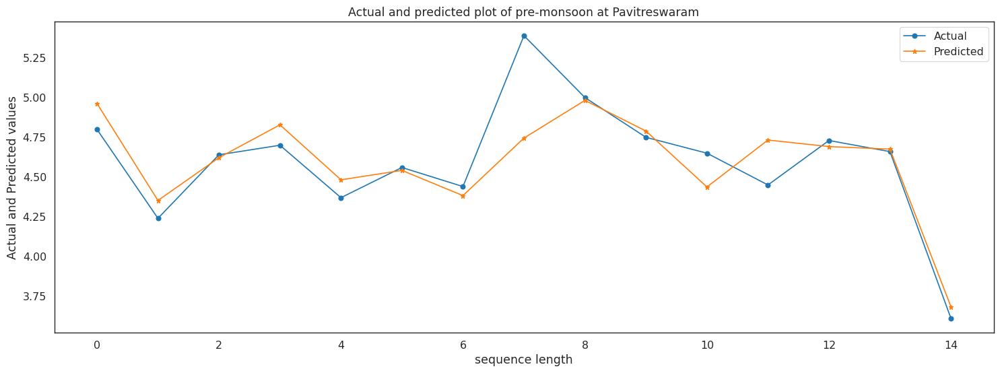

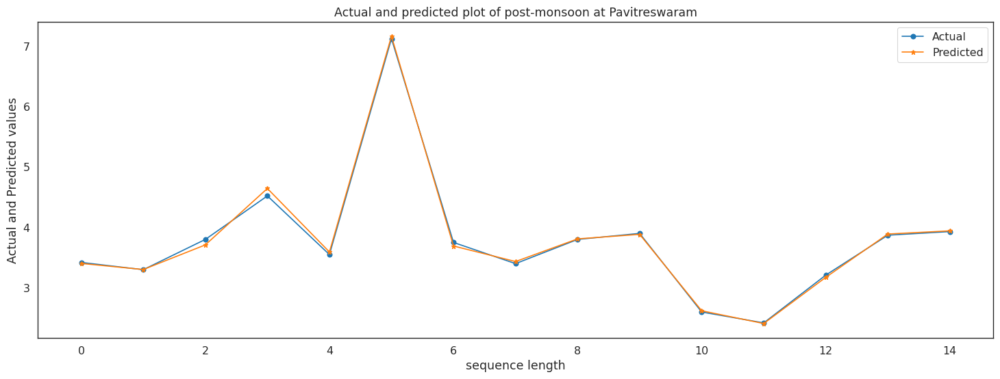

Epoch 1/100
1/1 - 3s - loss: 71.4465 - accuracy: 0.0000e+00 - 3s/epoch - 3s/step
Epoch 2/100
1/1 - 0s - loss: 70.5289 - accuracy: 0.0000e+00 - 17ms/epoch - 17ms/step
Epoch 3/100
1/1 - 0s - loss: 69.6593 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 4/100
1/1 - 0s - loss: 68.8272 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 5/100
1/1 - 0s - loss: 68.0257 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 6/100
1/1 - 0s - loss: 67.2487 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 7/100
1/1 - 0s - loss: 66.4903 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 8/100
1/1 - 0s - loss: 65.7448 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 9/100
1/1 - 0s - loss: 65.0067 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 10/100
1/1 - 0s - loss: 64.2712 - accuracy: 0.0000e+00 - 15ms/epoch - 15ms/step
Epoch 11/100
1/1 - 0s - loss: 63.5336 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 12/100
1/1 - 0s - loss: 62.7897 - accuracy: 0.0000e+00 - 10ms/epoch - 10m

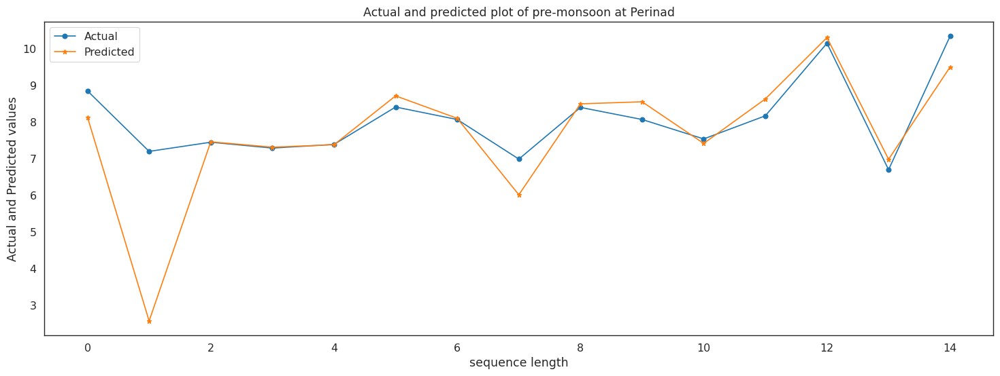

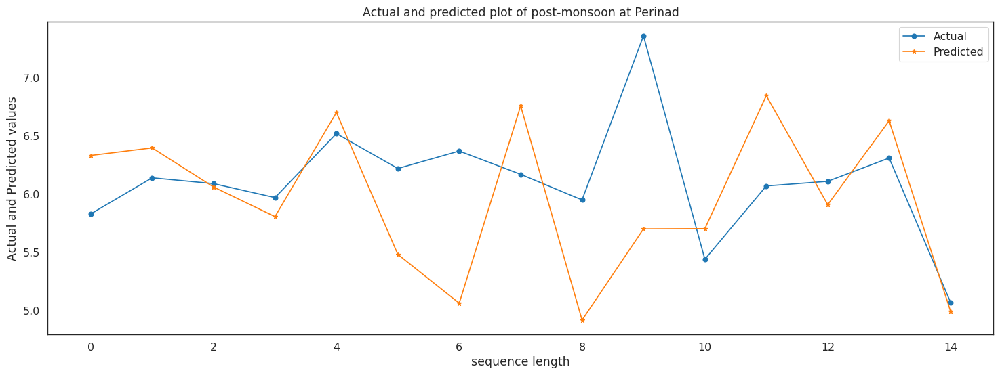

Epoch 1/100
1/1 - 3s - loss: 36.9538 - accuracy: 0.0000e+00 - 3s/epoch - 3s/step
Epoch 2/100
1/1 - 0s - loss: 35.9532 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 3/100
1/1 - 0s - loss: 34.9621 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 4/100
1/1 - 0s - loss: 33.9765 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 5/100
1/1 - 0s - loss: 32.9928 - accuracy: 0.0000e+00 - 8ms/epoch - 8ms/step
Epoch 6/100
1/1 - 0s - loss: 32.0067 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 7/100
1/1 - 0s - loss: 31.0145 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 8/100
1/1 - 0s - loss: 30.0126 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 9/100
1/1 - 0s - loss: 28.9979 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 10/100
1/1 - 0s - loss: 27.9681 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 11/100
1/1 - 0s - loss: 26.9218 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 12/100
1/1 - 0s - loss: 25.8582 - accuracy: 0.0000e+00 - 10ms/epoch

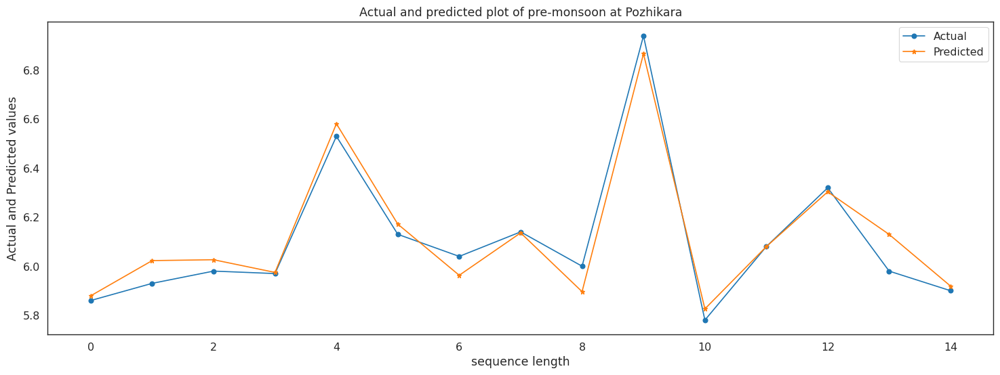

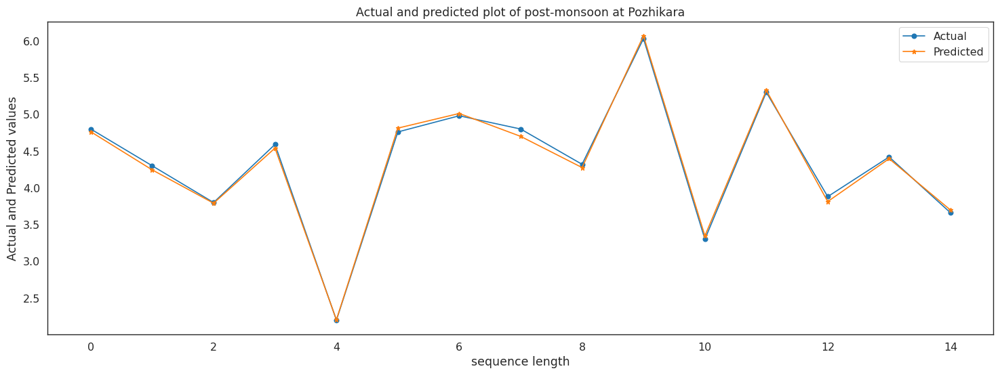

Epoch 1/100
1/1 - 3s - loss: 61.6638 - accuracy: 0.0000e+00 - 3s/epoch - 3s/step
Epoch 2/100
1/1 - 0s - loss: 60.7632 - accuracy: 0.0000e+00 - 16ms/epoch - 16ms/step
Epoch 3/100
1/1 - 0s - loss: 59.8516 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 4/100
1/1 - 0s - loss: 58.9226 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 5/100
1/1 - 0s - loss: 57.9691 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 6/100
1/1 - 0s - loss: 56.9849 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 7/100
1/1 - 0s - loss: 55.9642 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 8/100
1/1 - 0s - loss: 54.9014 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 9/100
1/1 - 0s - loss: 53.7911 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 10/100
1/1 - 0s - loss: 52.6287 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 11/100
1/1 - 0s - loss: 51.4094 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 12/100
1/1 - 0s - loss: 50.1336 - accuracy: 0.0000e+00 - 11ms/e

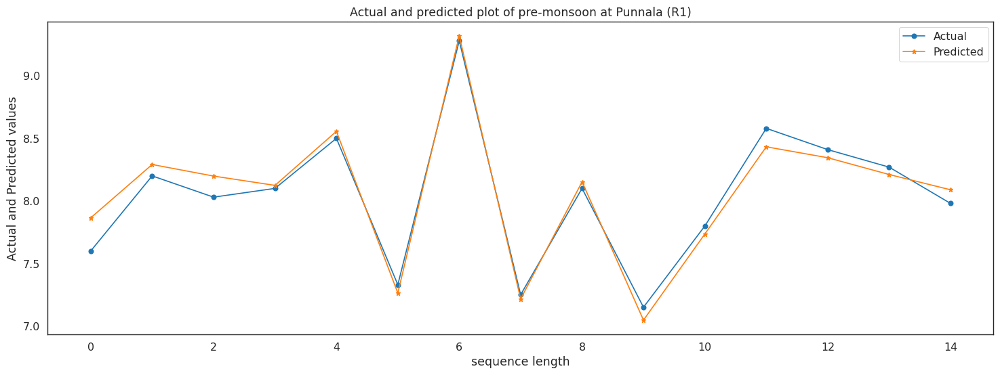

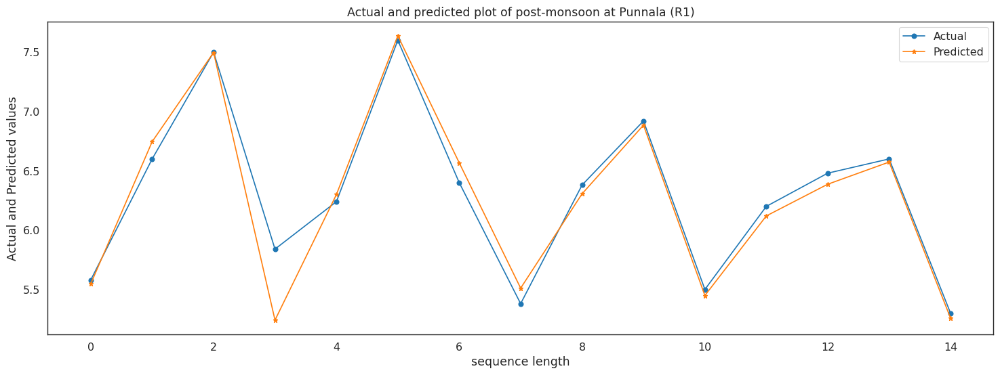

Epoch 1/100
1/1 - 3s - loss: 83.0786 - accuracy: 0.0000e+00 - 3s/epoch - 3s/step
Epoch 2/100
1/1 - 0s - loss: 82.0449 - accuracy: 0.0000e+00 - 20ms/epoch - 20ms/step
Epoch 3/100
1/1 - 0s - loss: 81.0217 - accuracy: 0.0000e+00 - 15ms/epoch - 15ms/step
Epoch 4/100
1/1 - 0s - loss: 79.9995 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 5/100
1/1 - 0s - loss: 78.9694 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 6/100
1/1 - 0s - loss: 77.9230 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 7/100
1/1 - 0s - loss: 76.8525 - accuracy: 0.0000e+00 - 8ms/epoch - 8ms/step
Epoch 8/100
1/1 - 0s - loss: 75.7507 - accuracy: 0.0000e+00 - 8ms/epoch - 8ms/step
Epoch 9/100
1/1 - 0s - loss: 74.6113 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 10/100
1/1 - 0s - loss: 73.4288 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 11/100
1/1 - 0s - loss: 72.2129 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 12/100
1/1 - 0s - loss: 70.9994 - accuracy: 0.0000e+00 - 12ms/epoch

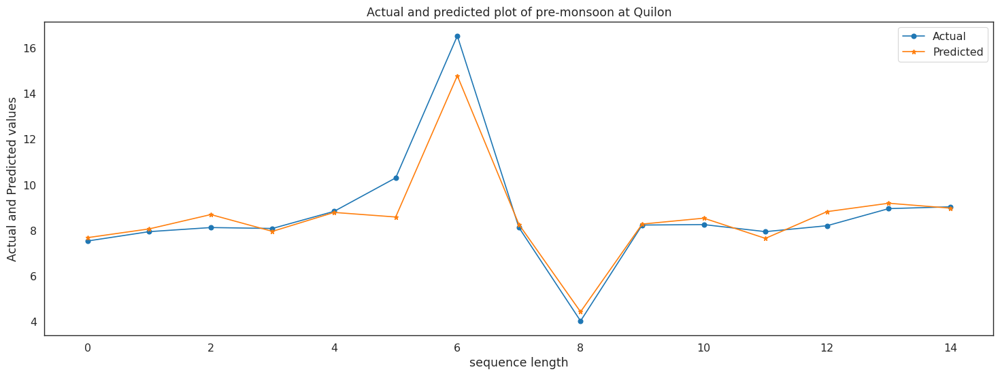

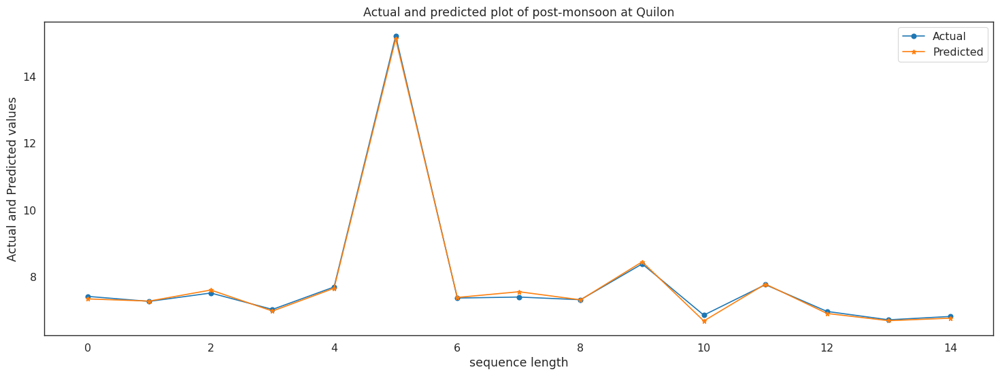

Epoch 1/100
1/1 - 4s - loss: 31.9055 - accuracy: 0.0000e+00 - 4s/epoch - 4s/step
Epoch 2/100
1/1 - 0s - loss: 31.2545 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 3/100
1/1 - 0s - loss: 30.5997 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 4/100
1/1 - 0s - loss: 29.9378 - accuracy: 0.0000e+00 - 15ms/epoch - 15ms/step
Epoch 5/100
1/1 - 0s - loss: 29.2655 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 6/100
1/1 - 0s - loss: 28.5799 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 7/100
1/1 - 0s - loss: 27.8782 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 8/100
1/1 - 0s - loss: 27.1583 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 9/100
1/1 - 0s - loss: 26.4191 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 10/100
1/1 - 0s - loss: 25.6597 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 11/100
1/1 - 0s - loss: 24.8799 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 12/100
1/1 - 0s - loss: 24.0805 - accuracy: 0.0000e+00 - 10ms

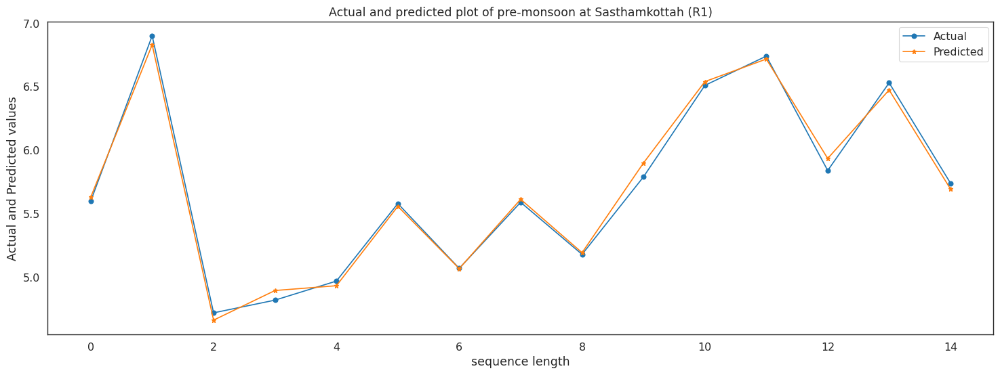

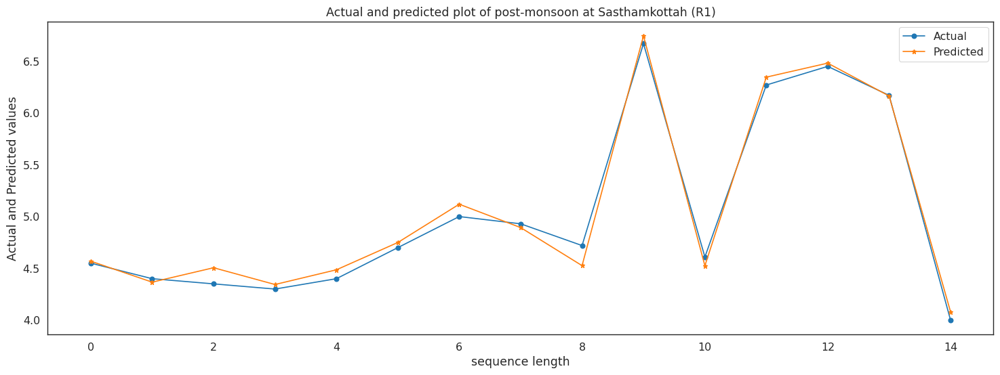

Epoch 1/100
1/1 - 3s - loss: 73.9507 - accuracy: 0.0000e+00 - 3s/epoch - 3s/step
Epoch 2/100
1/1 - 0s - loss: 72.9836 - accuracy: 0.0000e+00 - 14ms/epoch - 14ms/step
Epoch 3/100
1/1 - 0s - loss: 72.0288 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 4/100
1/1 - 0s - loss: 71.0719 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 5/100
1/1 - 0s - loss: 70.0982 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 6/100
1/1 - 0s - loss: 69.1032 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 7/100
1/1 - 0s - loss: 68.0826 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 8/100
1/1 - 0s - loss: 67.0326 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 9/100
1/1 - 0s - loss: 65.9501 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 10/100
1/1 - 0s - loss: 64.8322 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 11/100
1/1 - 0s - loss: 63.6767 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 12/100
1/1 - 0s - loss: 62.4817 - accuracy: 0.0000e+00 - 9ms/epoch 

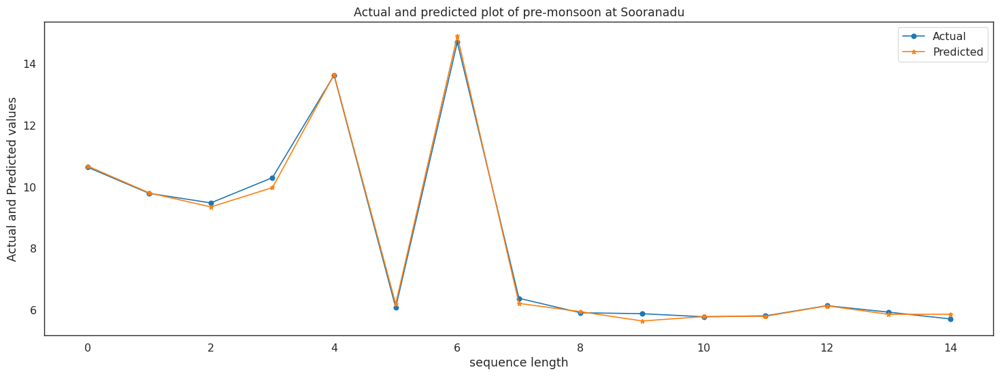

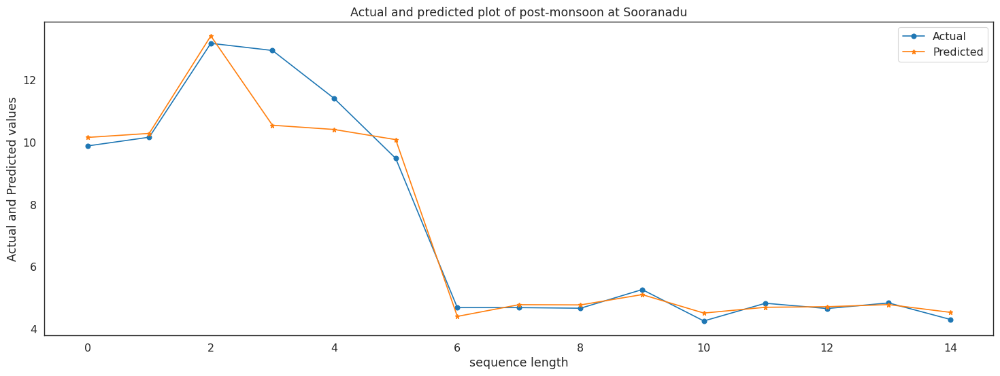

Epoch 1/100
1/1 - 2s - loss: 83.8328 - accuracy: 0.0000e+00 - 2s/epoch - 2s/step
Epoch 2/100
1/1 - 0s - loss: 82.6251 - accuracy: 0.0000e+00 - 15ms/epoch - 15ms/step
Epoch 3/100
1/1 - 0s - loss: 81.5418 - accuracy: 0.0000e+00 - 15ms/epoch - 15ms/step
Epoch 4/100
1/1 - 0s - loss: 80.4642 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 5/100
1/1 - 0s - loss: 79.3887 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 6/100
1/1 - 0s - loss: 78.3130 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 7/100
1/1 - 0s - loss: 77.2346 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 8/100
1/1 - 0s - loss: 76.1509 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 9/100
1/1 - 0s - loss: 75.0592 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 10/100
1/1 - 0s - loss: 73.9566 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 11/100
1/1 - 0s - loss: 72.8400 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 12/100
1/1 - 0s - loss: 71.7062 - accuracy: 0.0000e+00 - 10ms/epo

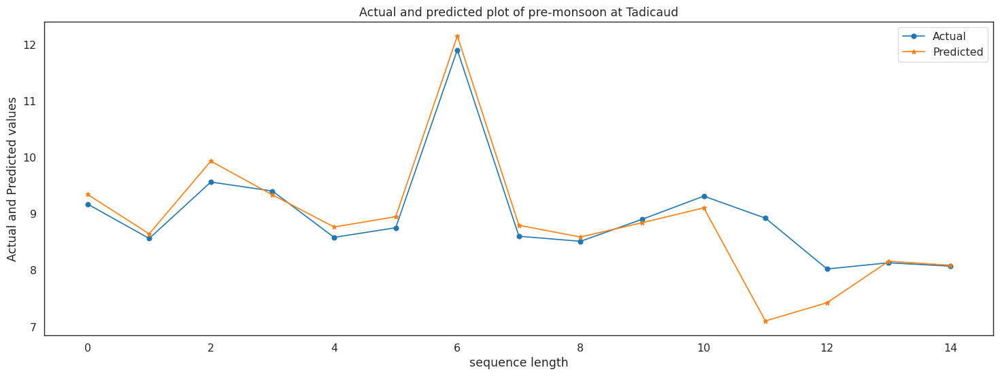

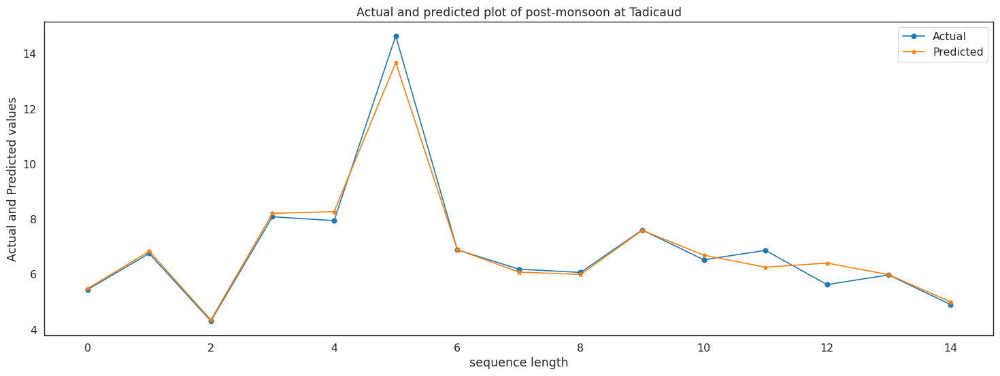

Epoch 1/100
1/1 - 2s - loss: 72.7468 - accuracy: 1.0000 - 2s/epoch - 2s/step
Epoch 2/100
1/1 - 0s - loss: 71.2809 - accuracy: 1.0000 - 14ms/epoch - 14ms/step
Epoch 3/100
1/1 - 0s - loss: 69.8652 - accuracy: 1.0000 - 13ms/epoch - 13ms/step
Epoch 4/100
1/1 - 0s - loss: 68.4946 - accuracy: 1.0000 - 13ms/epoch - 13ms/step
Epoch 5/100
1/1 - 0s - loss: 67.1635 - accuracy: 1.0000 - 9ms/epoch - 9ms/step
Epoch 6/100
1/1 - 0s - loss: 65.8664 - accuracy: 1.0000 - 9ms/epoch - 9ms/step
Epoch 7/100
1/1 - 0s - loss: 64.6287 - accuracy: 1.0000 - 14ms/epoch - 14ms/step
Epoch 8/100
1/1 - 0s - loss: 63.4583 - accuracy: 1.0000 - 9ms/epoch - 9ms/step
Epoch 9/100
1/1 - 0s - loss: 62.2953 - accuracy: 1.0000 - 9ms/epoch - 9ms/step
Epoch 10/100
1/1 - 0s - loss: 61.1382 - accuracy: 1.0000 - 10ms/epoch - 10ms/step
Epoch 11/100
1/1 - 0s - loss: 59.9845 - accuracy: 1.0000 - 8ms/epoch - 8ms/step
Epoch 12/100
1/1 - 0s - loss: 58.8340 - accuracy: 1.0000 - 9ms/epoch - 9ms/step
Epoch 13/100
1/1 - 0s - loss: 57.6861 - a

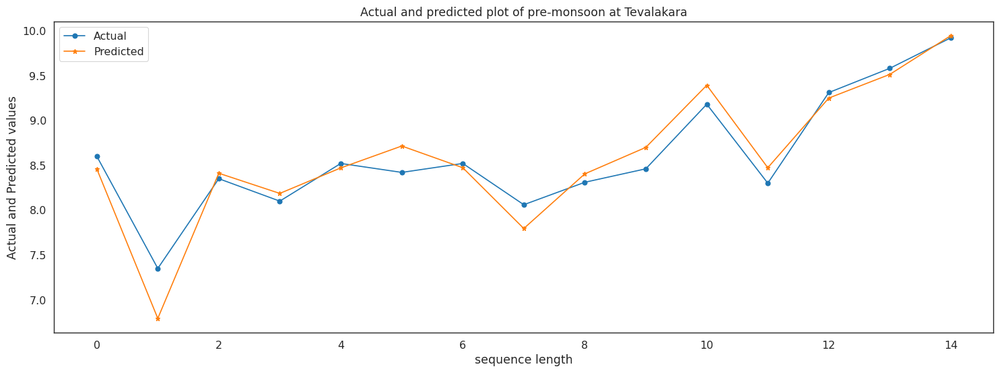

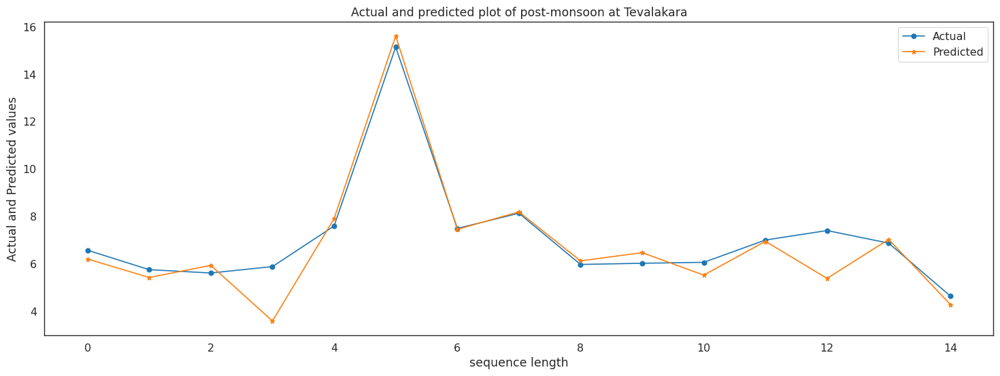

Epoch 1/100
1/1 - 4s - loss: 59.9592 - accuracy: 0.0000e+00 - 4s/epoch - 4s/step
Epoch 2/100
1/1 - 0s - loss: 58.8230 - accuracy: 0.0000e+00 - 14ms/epoch - 14ms/step
Epoch 3/100
1/1 - 0s - loss: 57.7430 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 4/100
1/1 - 0s - loss: 56.7132 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 5/100
1/1 - 0s - loss: 55.7266 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 6/100
1/1 - 0s - loss: 54.7763 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 7/100
1/1 - 0s - loss: 53.8560 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 8/100
1/1 - 0s - loss: 52.9605 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 9/100
1/1 - 0s - loss: 52.0838 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 10/100
1/1 - 0s - loss: 51.2200 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 11/100
1/1 - 0s - loss: 50.3650 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 12/100
1/1 - 0s - loss: 49.5487 - accuracy: 0.0000e+00 - 9ms/epoch - 

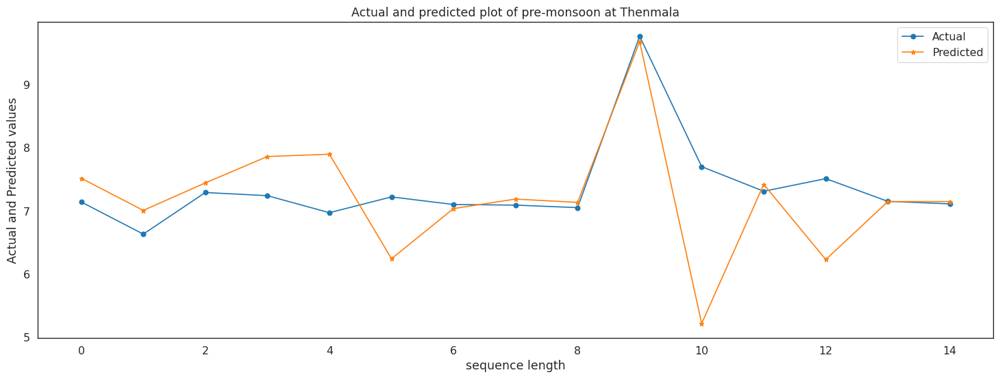

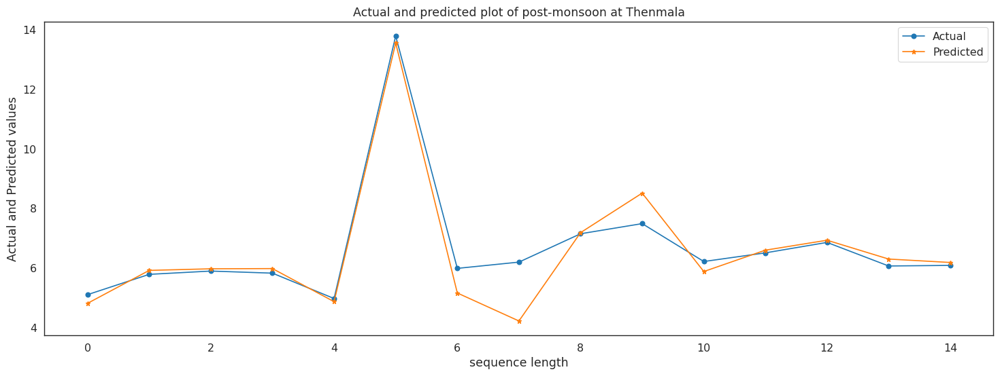

Epoch 1/100
1/1 - 3s - loss: 105.7219 - accuracy: 0.0000e+00 - 3s/epoch - 3s/step
Epoch 2/100
1/1 - 0s - loss: 103.5942 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 3/100
1/1 - 0s - loss: 101.5995 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 4/100
1/1 - 0s - loss: 99.7589 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 5/100
1/1 - 0s - loss: 98.0404 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 6/100
1/1 - 0s - loss: 96.3845 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 7/100
1/1 - 0s - loss: 94.7754 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 8/100
1/1 - 0s - loss: 93.1997 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 9/100
1/1 - 0s - loss: 91.6452 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 10/100
1/1 - 0s - loss: 90.1009 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 11/100
1/1 - 0s - loss: 88.5563 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 12/100
1/1 - 0s - loss: 87.0016 - accuracy: 0.0000e+00 - 9ms/e

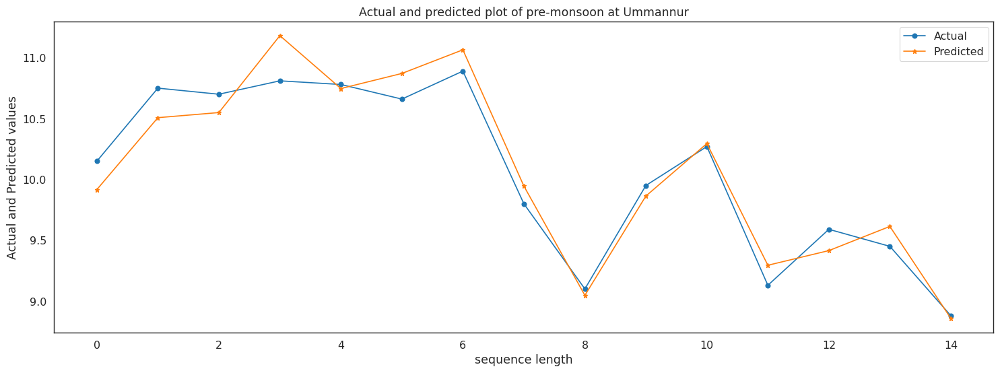

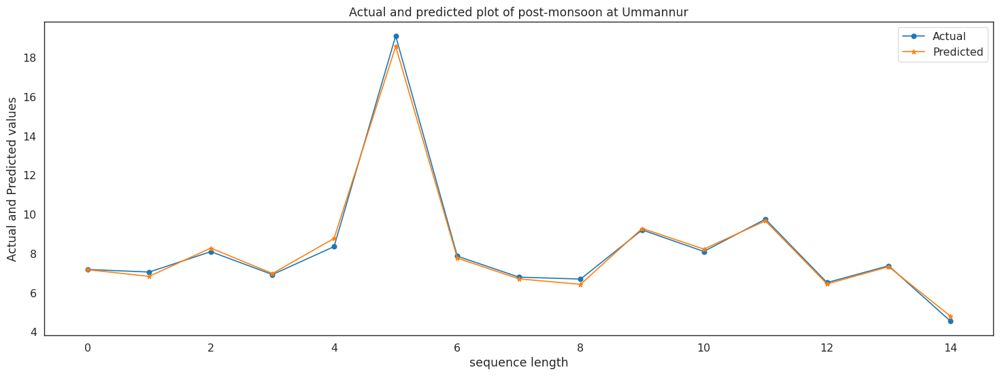

Epoch 1/100
1/1 - 3s - loss: 2.7421 - accuracy: 0.0000e+00 - 3s/epoch - 3s/step
Epoch 2/100
1/1 - 0s - loss: 2.6843 - accuracy: 0.0000e+00 - 16ms/epoch - 16ms/step
Epoch 3/100
1/1 - 0s - loss: 2.6285 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 4/100
1/1 - 0s - loss: 2.5747 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 5/100
1/1 - 0s - loss: 2.5228 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 6/100
1/1 - 0s - loss: 2.4728 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 7/100
1/1 - 0s - loss: 2.4266 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 8/100
1/1 - 0s - loss: 2.3821 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 9/100
1/1 - 0s - loss: 2.3387 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 10/100
1/1 - 0s - loss: 2.2980 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 11/100
1/1 - 0s - loss: 2.2575 - accuracy: 0.0000e+00 - 14ms/epoch - 14ms/step
Epoch 12/100
1/1 - 0s - loss: 2.2172 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epo

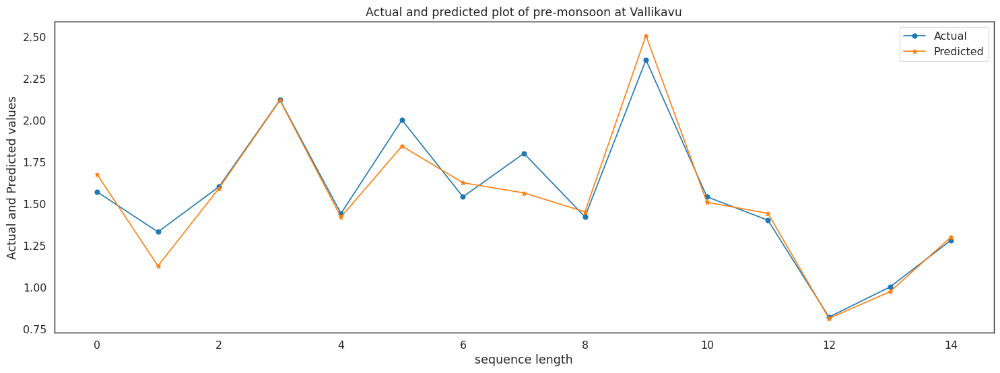

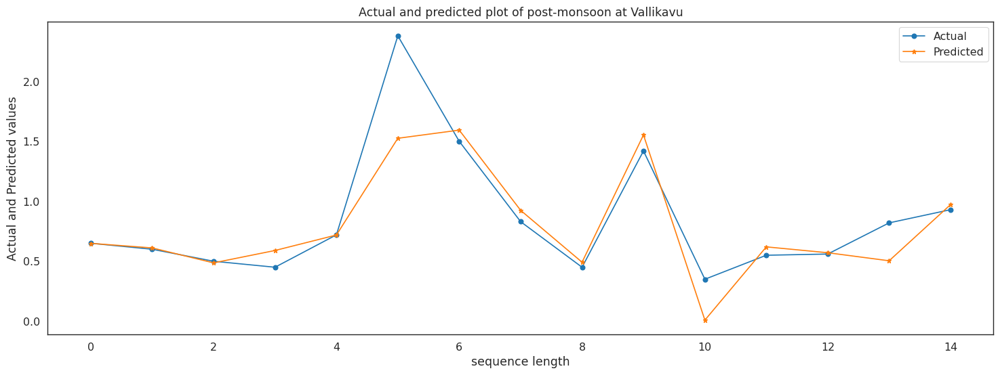

Epoch 1/100
1/1 - 2s - loss: 7.4506 - accuracy: 0.0000e+00 - 2s/epoch - 2s/step
Epoch 2/100
1/1 - 0s - loss: 7.3365 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 3/100
1/1 - 0s - loss: 7.2198 - accuracy: 0.0000e+00 - 14ms/epoch - 14ms/step
Epoch 4/100
1/1 - 0s - loss: 7.1005 - accuracy: 0.0000e+00 - 15ms/epoch - 15ms/step
Epoch 5/100
1/1 - 0s - loss: 6.9778 - accuracy: 0.0000e+00 - 14ms/epoch - 14ms/step
Epoch 6/100
1/1 - 0s - loss: 6.8512 - accuracy: 0.0000e+00 - 14ms/epoch - 14ms/step
Epoch 7/100
1/1 - 0s - loss: 6.7203 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 8/100
1/1 - 0s - loss: 6.5850 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 9/100
1/1 - 0s - loss: 6.4465 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 10/100
1/1 - 0s - loss: 6.3025 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 11/100
1/1 - 0s - loss: 6.1529 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 12/100
1/1 - 0s - loss: 5.9974 - accuracy: 0.0000e+00 - 11ms/epoch - 11m

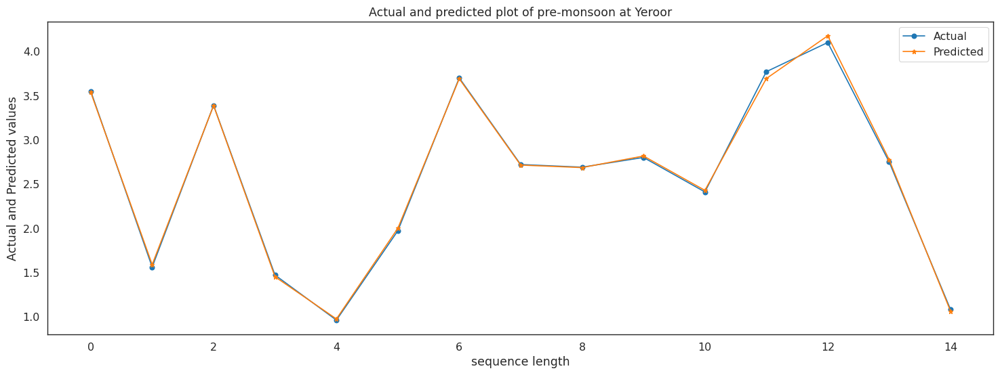

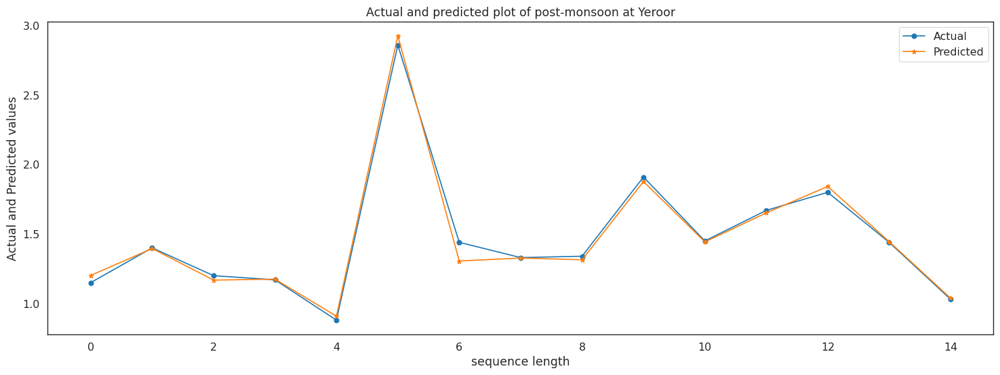

Epoch 1/100
1/1 - 3s - loss: 87.3980 - accuracy: 0.0000e+00 - 3s/epoch - 3s/step
Epoch 2/100
1/1 - 0s - loss: 86.3302 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 3/100
1/1 - 0s - loss: 85.3174 - accuracy: 0.0000e+00 - 14ms/epoch - 14ms/step
Epoch 4/100
1/1 - 0s - loss: 84.3449 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 5/100
1/1 - 0s - loss: 83.3978 - accuracy: 0.0000e+00 - 19ms/epoch - 19ms/step
Epoch 6/100
1/1 - 0s - loss: 82.4608 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 7/100
1/1 - 0s - loss: 81.5189 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 8/100
1/1 - 0s - loss: 80.5572 - accuracy: 0.0000e+00 - 14ms/epoch - 14ms/step
Epoch 9/100
1/1 - 0s - loss: 79.5613 - accuracy: 0.0000e+00 - 8ms/epoch - 8ms/step
Epoch 10/100
1/1 - 0s - loss: 78.5242 - accuracy: 0.0000e+00 - 17ms/epoch - 17ms/step
Epoch 11/100
1/1 - 0s - loss: 77.4254 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 12/100
1/1 - 0s - loss: 76.2511 - accuracy: 0.0000e+00 - 12ms/epoch

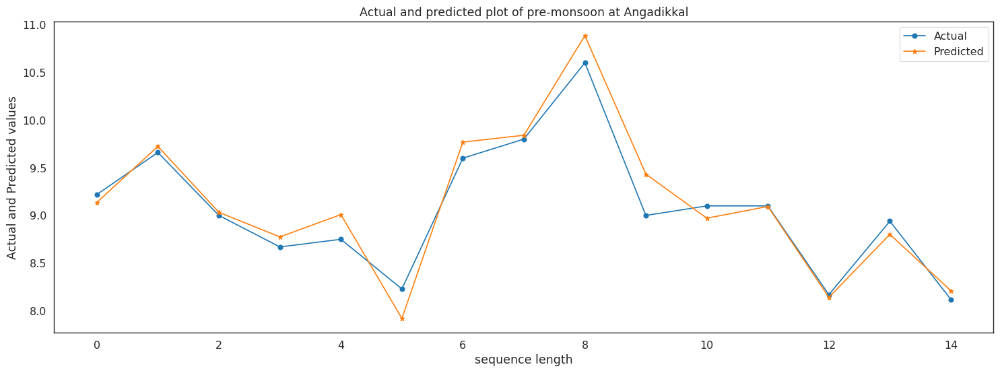

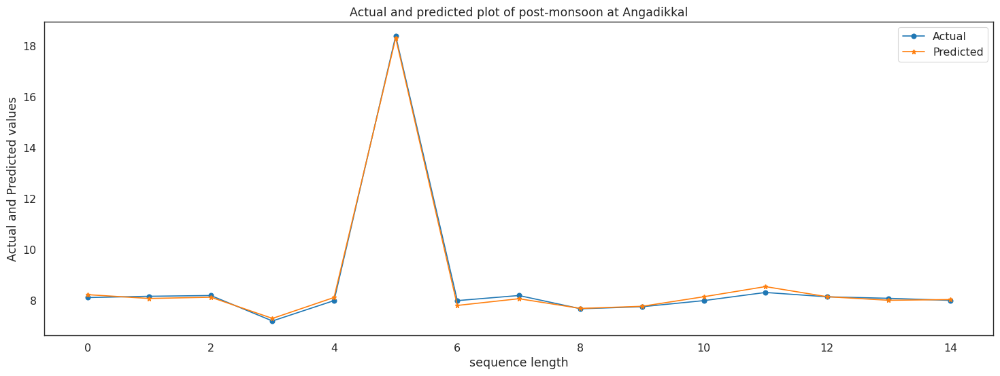

Epoch 1/100
1/1 - 3s - loss: 39.3772 - accuracy: 0.0000e+00 - 3s/epoch - 3s/step
Epoch 2/100
1/1 - 0s - loss: 38.3408 - accuracy: 0.0000e+00 - 16ms/epoch - 16ms/step
Epoch 3/100
1/1 - 0s - loss: 37.3327 - accuracy: 0.0000e+00 - 18ms/epoch - 18ms/step
Epoch 4/100
1/1 - 0s - loss: 36.3506 - accuracy: 0.0000e+00 - 14ms/epoch - 14ms/step
Epoch 5/100
1/1 - 0s - loss: 35.4002 - accuracy: 0.0000e+00 - 14ms/epoch - 14ms/step
Epoch 6/100
1/1 - 0s - loss: 34.4709 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 7/100
1/1 - 0s - loss: 33.5577 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 8/100
1/1 - 0s - loss: 32.6568 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 9/100
1/1 - 0s - loss: 31.7648 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 10/100
1/1 - 0s - loss: 30.8777 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 11/100
1/1 - 0s - loss: 29.9916 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 12/100
1/1 - 0s - loss: 29.1026 - accuracy: 0.0000e+00 - 15ms/epo

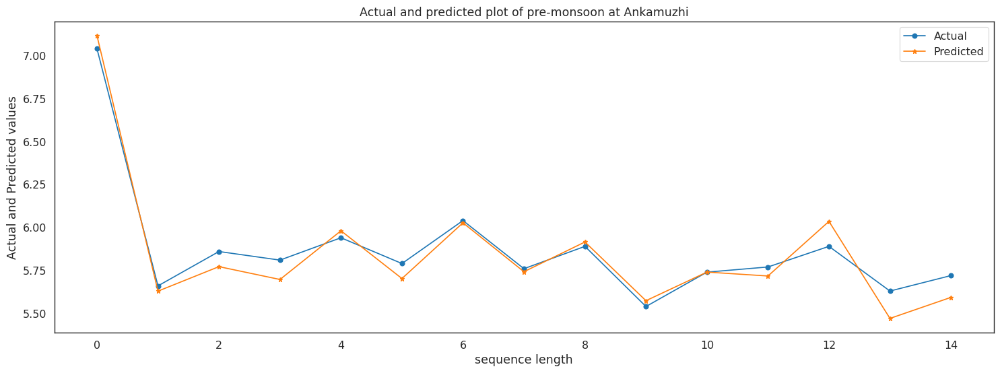

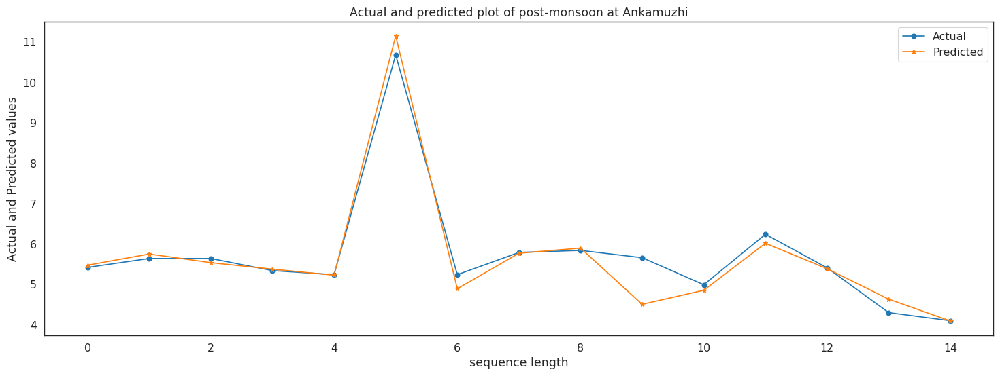

Epoch 1/100
1/1 - 2s - loss: 6.1491 - accuracy: 0.0000e+00 - 2s/epoch - 2s/step
Epoch 2/100
1/1 - 0s - loss: 6.0450 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 3/100
1/1 - 0s - loss: 5.9433 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 4/100
1/1 - 0s - loss: 5.8439 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 5/100
1/1 - 0s - loss: 5.7469 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 6/100
1/1 - 0s - loss: 5.6513 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 7/100
1/1 - 0s - loss: 5.5567 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 8/100
1/1 - 0s - loss: 5.4626 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 9/100
1/1 - 0s - loss: 5.3695 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 10/100
1/1 - 0s - loss: 5.2765 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 11/100
1/1 - 0s - loss: 5.1829 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 12/100
1/1 - 0s - loss: 5.0885 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 13/10

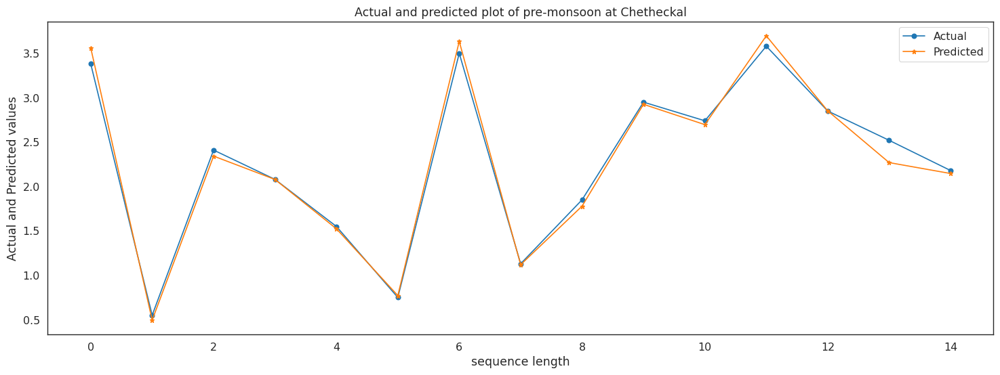

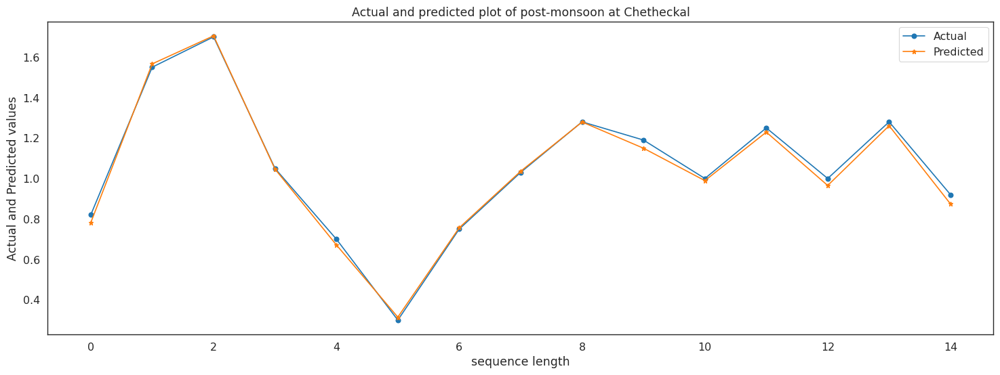

Epoch 1/100
1/1 - 4s - loss: 5.2834 - accuracy: 0.0000e+00 - 4s/epoch - 4s/step
Epoch 2/100
1/1 - 0s - loss: 5.2184 - accuracy: 0.0000e+00 - 14ms/epoch - 14ms/step
Epoch 3/100
1/1 - 0s - loss: 5.1539 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 4/100
1/1 - 0s - loss: 5.0904 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 5/100
1/1 - 0s - loss: 5.0266 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 6/100
1/1 - 0s - loss: 4.9628 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 7/100
1/1 - 0s - loss: 4.8980 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 8/100
1/1 - 0s - loss: 4.8318 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 9/100
1/1 - 0s - loss: 4.7640 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 10/100
1/1 - 0s - loss: 4.6972 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 11/100
1/1 - 0s - loss: 4.6301 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 12/100
1/1 - 0s - loss: 4.5603 - accuracy: 0.0000e+00 - 14ms/epoch - 14ms/step
E

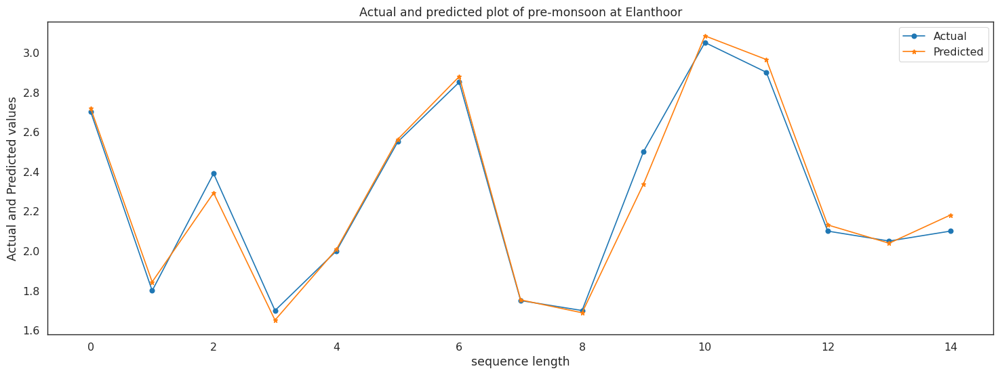

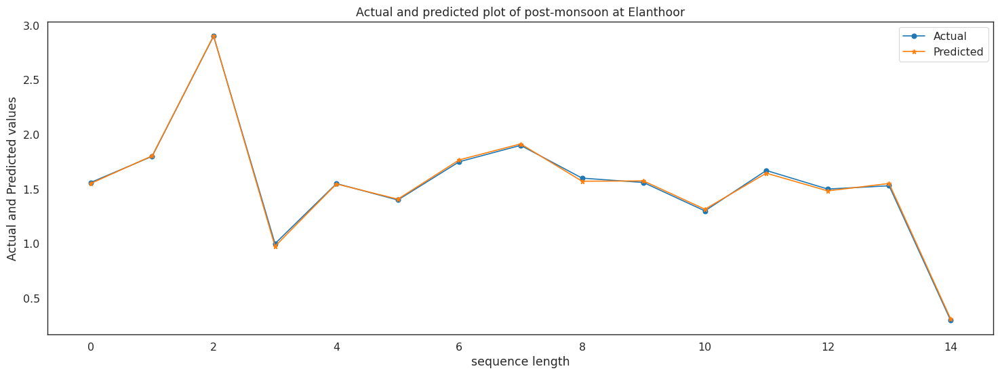

Epoch 1/100
1/1 - 2s - loss: 10.7406 - accuracy: 0.0000e+00 - 2s/epoch - 2s/step
Epoch 2/100
1/1 - 0s - loss: 10.5913 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 3/100
1/1 - 0s - loss: 10.4464 - accuracy: 0.0000e+00 - 8ms/epoch - 8ms/step
Epoch 4/100
1/1 - 0s - loss: 10.3052 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 5/100
1/1 - 0s - loss: 10.1693 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 6/100
1/1 - 0s - loss: 10.0383 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 7/100
1/1 - 0s - loss: 9.9078 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 8/100
1/1 - 0s - loss: 9.7771 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 9/100
1/1 - 0s - loss: 9.6456 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 10/100
1/1 - 0s - loss: 9.5125 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 11/100
1/1 - 0s - loss: 9.3780 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 12/100
1/1 - 0s - loss: 9.2447 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch

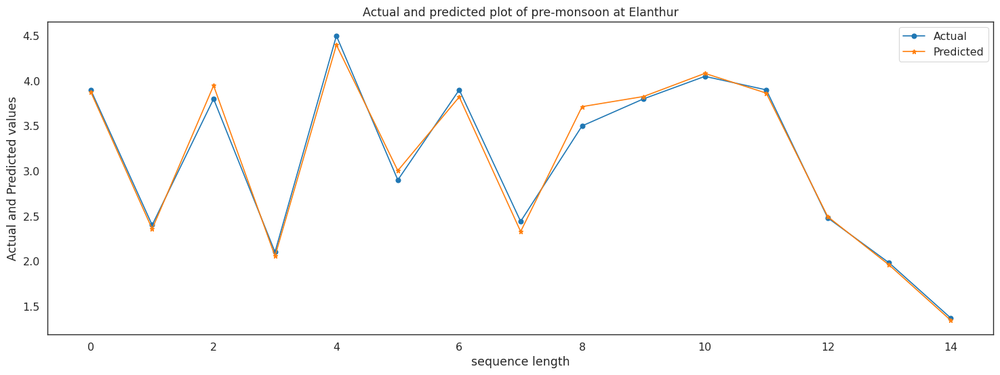

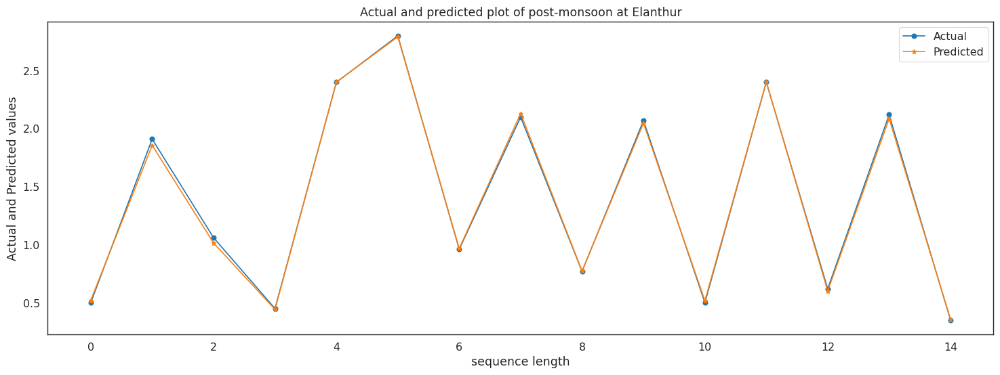

Epoch 1/100
1/1 - 2s - loss: 73.3566 - accuracy: 0.0000e+00 - 2s/epoch - 2s/step
Epoch 2/100
1/1 - 0s - loss: 72.5279 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 3/100
1/1 - 0s - loss: 71.6943 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 4/100
1/1 - 0s - loss: 70.8459 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 5/100
1/1 - 0s - loss: 69.9733 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 6/100
1/1 - 0s - loss: 69.0673 - accuracy: 0.0000e+00 - 12ms/epoch - 12ms/step
Epoch 7/100
1/1 - 0s - loss: 68.1192 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 8/100
1/1 - 0s - loss: 67.1213 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 9/100
1/1 - 0s - loss: 66.0661 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 10/100
1/1 - 0s - loss: 64.9471 - accuracy: 0.0000e+00 - 13ms/epoch - 13ms/step
Epoch 11/100
1/1 - 0s - loss: 63.7603 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 12/100
1/1 - 0s - loss: 62.5001 - accuracy: 0.0000e+00 - 9ms/epoc

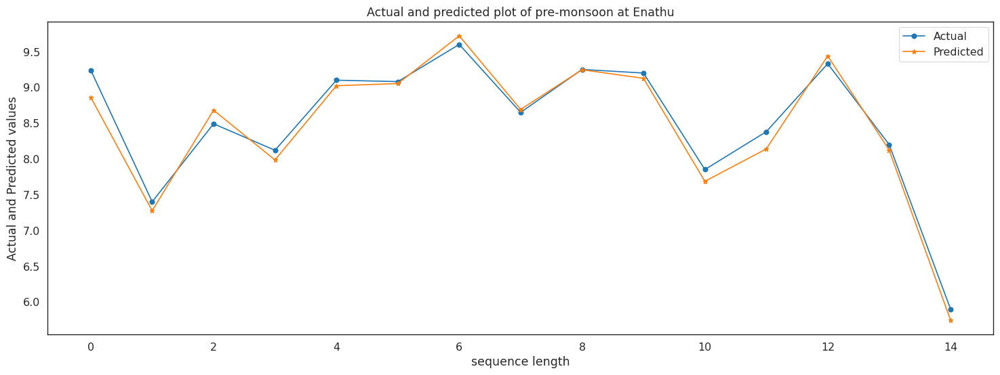

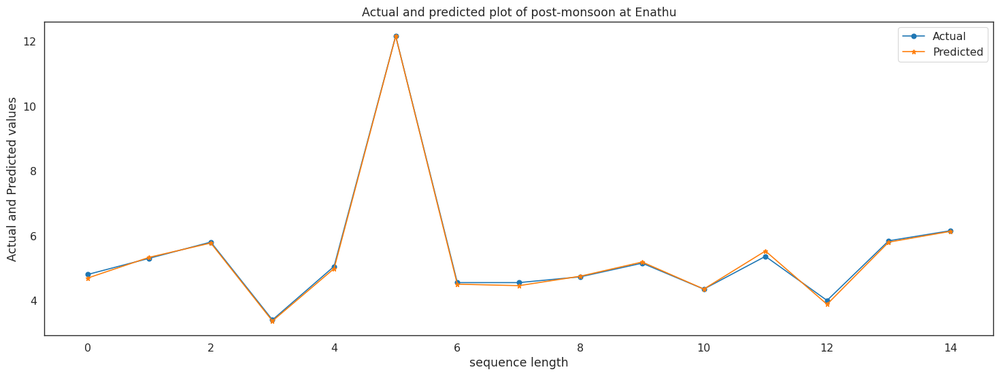

Epoch 1/100
1/1 - 2s - loss: 116.8342 - accuracy: 0.0000e+00 - 2s/epoch - 2s/step
Epoch 2/100
1/1 - 0s - loss: 114.3880 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 3/100
1/1 - 0s - loss: 112.0247 - accuracy: 0.0000e+00 - 9ms/epoch - 9ms/step
Epoch 4/100
1/1 - 0s - loss: 109.7209 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 5/100
1/1 - 0s - loss: 107.4618 - accuracy: 0.0000e+00 - 11ms/epoch - 11ms/step
Epoch 6/100
1/1 - 0s - loss: 105.2389 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 7/100
1/1 - 0s - loss: 103.0403 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 8/100
1/1 - 0s - loss: 100.8522 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 9/100
1/1 - 0s - loss: 98.6595 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 10/100
1/1 - 0s - loss: 96.4449 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 11/100
1/1 - 0s - loss: 94.1894 - accuracy: 0.0000e+00 - 10ms/epoch - 10ms/step
Epoch 12/100
1/1 - 0s - loss: 91.8793 - accuracy: 0.0000e+00 - 

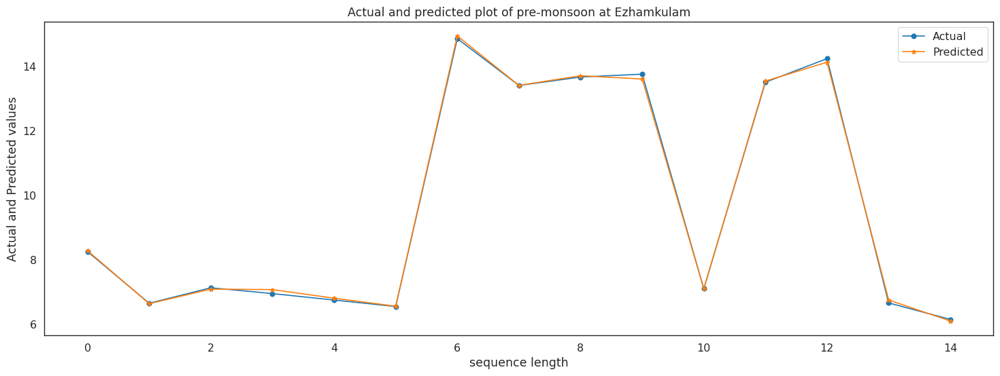

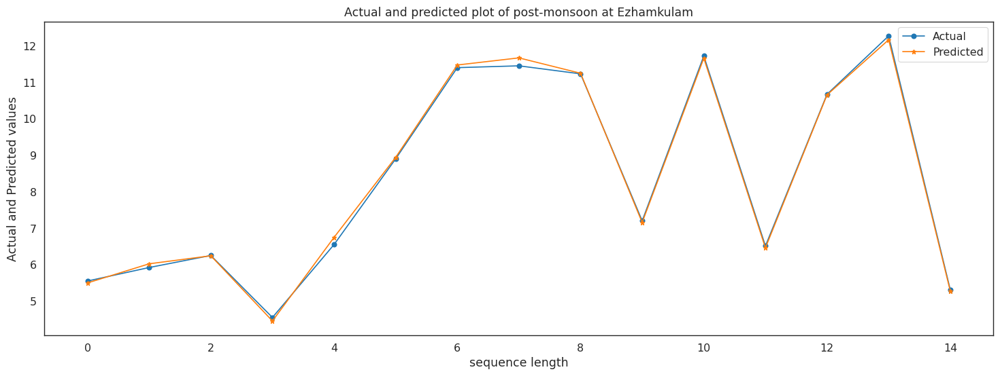

Not enough samples for Kaviyur, skipping...


TypeError: ignored

In [ ]:
def get_lstm_predictions(location,df_dict, min_samples=10):
  X1, y1, X2, y2 = prepare_data(location,df_dict, min_samples)
  #print(X1)
  # define the LSTM model architecture for X1
  model_1 = create_lstm_model(X1, y1)

  # fit the model to the pre-monsoon data
  model_1.fit(X1, y1, epochs=100, batch_size=32, verbose=2)

  # make predictions on the pre-monsoon data
  y1_pred = model_1.predict(X1)

  # evaluate the model's performance on the pre-monsoon data
  mse1 = np.mean((y1_pred - y1)**2)

  print(f"Mean squared error for {location} (pre-monsoon): {mse1}")


  # define the LSTM model architecture for X2
  model_2 = create_lstm_model(X2, y2)

  # fit the model to the pre-monsoon data
  model_2.fit(X2, y2, epochs=100, batch_size=32, verbose=2)

  # make predictions on the pre-monsoon data
  y2_pred = model_2.predict(X2)

  # evaluate the model's performance on the post-monsoon data
  mse2 = np.mean((y2_pred - y2)**2)
  print(f"Mean squared error for {location} (pre-monsoon): {mse2}")

  # make predictions on the post-monsoon data
  #y2_pred = model.predict(X)
  # evaluate the model's performance on the post-monsoon data
  #mse2 = np.mean((y2_pred - y2)**2)
  print(f"Mean squared error for {location} (post-monsoon): {mse2}")
  # calculate the loss
  loss = mse1 + mse2

  # print the model summary
  #print(f"Model Summary: {model_1.summary()}")

  #plot the graph for pre-monsoon

  plot_graphs(y1[0], y1_pred[0], "pre-monsoon", location)
  plot_graphs(y2[0], y2_pred[0], "post-monsoon", location)


  #print the model metrics "accuracy" if it exists
  if hasattr(model_1, "accuracy"):
    print( f"Model accuracy: {model_1.accuracy}")

  # return the mean of the predictions for both seasons, the mse for both seasons, and the loss
  return np.mean(y1_pred), np.mean(y2_pred), mse1, mse2, loss


# create an empty list to store the table data
table_data = []

# loop over each unique location and call get_lstm_predictions function
locations = dfs[sheet_name]['data']['Location'].unique()
df_dict = {'pre': dfs['pre monsoon'], 'post': dfs['post monsoon']}
for location in locations:
    res = get_lstm_predictions(location, df_dict, min_samples=1)
    if res is None:
        continue
    y1_pred, y2_pred, mse1, mse2, loss = res

    # append the location and predicted water levels to the table data
    table_data.append([location, y1_pred.flatten()[0], y2_pred.flatten()[0], mse1, mse2, loss])

# sort the table data by pre-monsoon predictions in descending order
#table_data.sort(key=lambda x: x[1], reverse=True)

# add color to the column headers
table_headers = [Fore.GREEN + 'Location' + Style.RESET_ALL,
                 Fore.BLUE + 'Predicted water level for pre-Monsoon' + Style.RESET_ALL,
                 Fore.BLUE + 'Predicted water level for post-Monsoon' + Style.RESET_ALL,
                 Fore.RED + 'MSE for pre-Monsoon' + Style.RESET_ALL,
                 Fore.RED + 'MSE for post-Monsoon' + Style.RESET_ALL,
                 Fore.RED + 'Loss' + Style.RESET_ALL]

# add color to the table rows based on the predicted water level
#for i, row in enumerate(table_data):
    #if row[1] > row[2]:
        #table_data[i] = [Fore.RED + str(val) + Style.RESET_ALL if isinstance(val, float) and val > 0.5 else val for val in row]
    #elif row[2] > row[1]:
       # table_data[i] = [Fore.GREEN + str(val) + Style.RESET_ALL if isinstance(val, float) and val > 0.5 else val for val in row]

# create the table using the tabulate library
table = tabulate(table_data, headers=table_headers)

# print the table
print(table)